# Pre-Conditioning & Apollo Analysis


# Apollo Restoration Difference Audit

## Scope
- PRE: MusicGen output (native SR: 32000 Hz)
- POST: Apollo output (native SR: 44100 Hz)

This notebook quantifies **signal differences** between PRE and POST.
If any intermediate preparation occurred between these two files, results reflect the **net change**.

## Settings (summary)
- Analysis SR: 44100 Hz
- STFT: N_FFT=4096, HOP=1024, window=hann, center=False
- dB scale: reference=max(S_PRE), top_db=80 dB (floor at -80 dB)
- Alignment: bounded to ±50 ms; estimated shift -0.347 samples (-0.008 ms)
- Level normalization: in-band gain match (band defined by PRE Nyquist ≈ 16000 Hz)

## Quick context
- Duration: 15.00 s
- Peak |x|: PRE 1.011, POST 1.000

## Compact verification (scalars)
- In-band coherence (mean): 0.9258
- In-band coherence (p10):  0.8499
- Quiet-frame in-band mean dB delta (POST−PRE): -1.98 dB

Environment: numpy 2.0.2, librosa 0.11.0, scipy 1.16.3



## 1) Time–frequency difference (Δ spectrogram)

**Question:** When and where (time × frequency) does the signal change?

**What it shows:** Δ = POST − PRE in dB (magnitude STFT).

**How to read it:**
- Near 0 dB: negligible change at that time–frequency bin
- Positive values: increased energy after processing
- Negative values: reduced energy after processing

**Typical patterns (interpretation aid):**
- Stationary band changes across time: consistent with filtering or steady suppression
- Localized time spikes: consistent with transient-focused processing
- Harmonic-aligned changes: suggests impact on musical partials (not only noise)

Color scale is clipped to ±12 dB for readability.


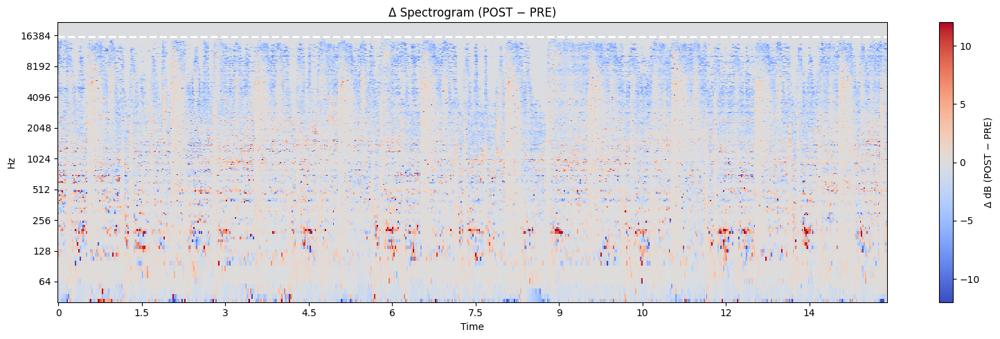


## 2) Average spectral residual

**Question:** Which frequency regions are most affected on average?

**What it shows:**
- PRE mean spectrum: mean(|STFT(PRE)|)
- Mean residual: mean(| |STFT(PRE)| − |STFT(POST)| |)

**How to read it:**
- Residual concentrated at very low frequencies: low-end reshaping / rumble control
- Residual concentrated near the top of the PRE band: high-band smoothing/suppression
- Residual peaks in mid-band: higher likelihood of modifying core musical content


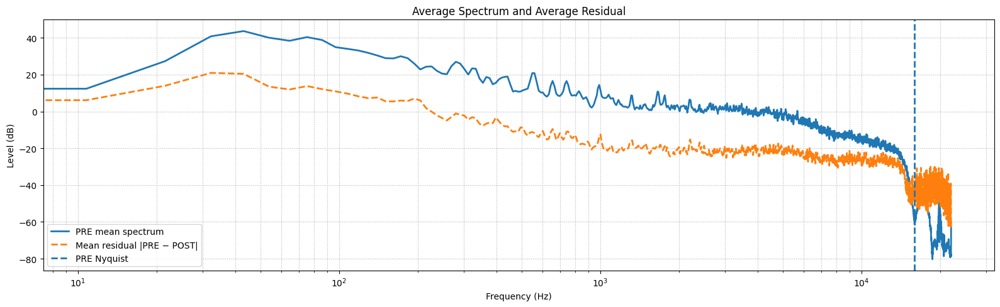


## 3) Distribution of spectral differences

**Question:** How strong are changes, and how often do they occur?

**What it shows:** Histogram of Δ dB values across time–frequency bins.

Bins at the dB floor are excluded (PRE ≤ -80 dB) to avoid inflating statistics.

**How to read it:**
- Narrow distribution around 0 dB: many small changes
- Heavy tails: fewer but stronger localized changes


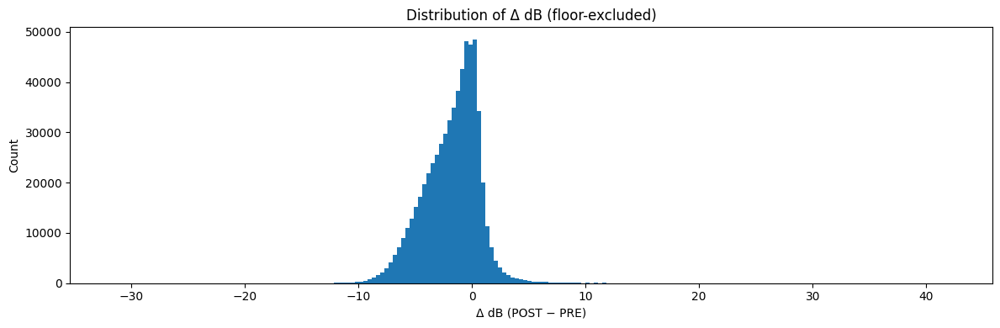


## 4) Macro-band summary

**Question:** In which broad bands do differences concentrate?

**What it shows:** Mean |Δ dB| per band, excluding floor bins (PRE > -80 dB).

**How to read it:** Higher values indicate stronger concentration of changes in that band.


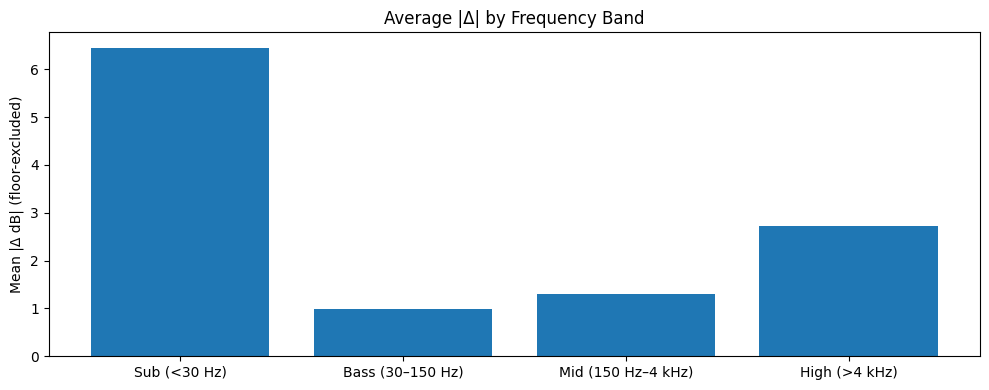


## 5) Scalar guardrails

**Question:** What is the typical magnitude of change (excluding near-silence)?

Summary statistics of |Δ dB| excluding bins where PRE ≤ -80 dB.


- Mean |Δ dB|: `2.235`
- Median |Δ dB|: `1.631`
- 90th percentile |Δ dB|: `5.136`


---
## Final conclusion

This audit provides a structured, signal-based description of how POST differs from PRE:
when changes occur (Δ spectrogram), where they concentrate on average (residual and band summary),
and how large they are statistically (distribution and guardrails). The scalar verification values
serve as consistency checks alongside the visual evidence.


In [1]:
#@title Apollo Restoration (MusicGen → Apollo)

import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from scipy.signal import resample_poly
import scipy
import math

# ============================================================
# Inputs
# ============================================================
INPUT_PATH  = "/content/musicgen_0.wav"   # @param {"type":"string"}
OUTPUT_PATH = "/content/apollo_0.wav"     # @param {"type":"string"}

# ============================================================
# Analysis parameters
# ============================================================
ANALYSIS_SR = 44100
N_FFT = 4096
HOP   = 1024
EPS   = 1e-12

TOP_DB = 80.0
SILENCE_DB = -TOP_DB

RESAMPLE_WINDOW = ("kaiser", 5.0)

MAX_ALIGN_SEC = 0.05
ALIGN_SEG_SEC = 8.0

STFT_WINDOW = "hann"
STFT_CENTER = False

# ============================================================
# Utilities
# ============================================================
def db(x: np.ndarray) -> np.ndarray:
    return 20.0 * np.log10(np.maximum(x, EPS))

def sanitize(x: np.ndarray) -> np.ndarray:
    return np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def resample_to(x: np.ndarray, orig_sr: int, target_sr: int) -> np.ndarray:
    x = sanitize(x)
    if int(orig_sr) == int(target_sr):
        return x
    g = math.gcd(int(orig_sr), int(target_sr))
    up = int(target_sr // g)
    down = int(orig_sr // g)
    y = resample_poly(x, up, down, window=RESAMPLE_WINDOW)
    return sanitize(y)

def choose_lag_min_abs(lags: np.ndarray, scores: np.ndarray) -> int:
    if lags.size == 0:
        return 0
    m = np.max(scores)
    cand = lags[scores == m]
    return int(cand[np.argmin(np.abs(cand))])

def parabolic_refine(lags: np.ndarray, scores: np.ndarray, lag0: int) -> float:
    if lags.size < 3:
        return float(lag0)
    idx = np.where(lags == lag0)[0]
    if idx.size == 0:
        return float(lag0)
    i = int(idx[0])
    if i == 0 or i == lags.size - 1:
        return float(lag0)

    s1, s2, s3 = float(scores[i - 1]), float(scores[i]), float(scores[i + 1])
    denom = (s1 - 2.0 * s2 + s3)
    if abs(denom) < 1e-20:
        return float(lag0)

    delta = 0.5 * (s1 - s3) / denom
    delta = float(np.clip(delta, -0.5, 0.5))
    return float(lag0 + delta)

def fractional_shift_fft(x: np.ndarray, shift_samples: float) -> np.ndarray:
    if abs(shift_samples) < 1e-9:
        return x.astype(np.float32, copy=False)

    x64 = x.astype(np.float64, copy=False)
    pad = int(np.ceil(abs(shift_samples))) + 16
    xpad = np.pad(x64, (pad, pad), mode="constant")

    n = int(1 << int(np.ceil(np.log2(len(xpad) + 1))))
    X = np.fft.rfft(xpad, n=n)
    k = np.arange(X.size, dtype=np.float64)
    phase = np.exp(-2j * np.pi * k * shift_samples / n)

    y = np.fft.irfft(X * phase, n=n)[:len(xpad)]
    y = y[pad:pad + len(x64)]
    return sanitize(y)

def apply_alignment(pre: np.ndarray, post: np.ndarray, lag_samples: float) -> tuple[np.ndarray, np.ndarray]:
    lag_int = int(np.trunc(lag_samples))
    lag_frac = float(lag_samples - lag_int)

    if lag_int > 0:
        post = post[lag_int:]
        pre = pre[:len(post)]
    elif lag_int < 0:
        pre = pre[-lag_int:]
        post = post[:len(pre)]

    if abs(lag_frac) > 1e-9:
        if lag_samples > 0:
            post = fractional_shift_fft(post, -lag_frac)
        elif lag_samples < 0:
            pre = fractional_shift_fft(pre, +lag_frac)

    m = min(len(pre), len(post))
    return pre[:m], post[:m]

def frame_rms_from_mag(S_mag: np.ndarray) -> np.ndarray:
    return np.sqrt(np.mean(S_mag**2, axis=0) + EPS)

# ============================================================
# Load + resample for analysis
# ============================================================
x_pre_native,  sr_pre_native  = librosa.load(INPUT_PATH,  sr=None, mono=True)
x_post_native, sr_post_native = librosa.load(OUTPUT_PATH, sr=None, mono=True)

x_pre  = resample_to(x_pre_native,  sr_pre_native,  ANALYSIS_SR)
x_post = resample_to(x_post_native, sr_post_native, ANALYSIS_SR)

min_len0 = min(len(x_pre), len(x_post))
if min_len0 <= max(N_FFT, 2):
    raise ValueError("Audio too short for stable analysis. Verify input/output paths.")

# ============================================================
# Time alignment (bounded; energetic excerpt; sub-sample refined)
# ============================================================
max_shift = int(MAX_ALIGN_SEC * ANALYSIS_SR)

x_pre0  = x_pre[:min_len0]
x_post0 = x_post[:min_len0]

rms_frames = librosa.feature.rms(
    y=x_pre0,
    frame_length=N_FFT,
    hop_length=HOP,
    center=False
)[0]
peak_frame = int(np.argmax(rms_frames))
peak_sample = peak_frame * HOP

seg_len = int(min(ALIGN_SEG_SEC, min_len0 / ANALYSIS_SR) * ANALYSIS_SR)
seg_len = min_len0 if min_len0 < int(1.0 * ANALYSIS_SR) else seg_len
seg_len = max(1, seg_len)

seg_start = int(np.clip(peak_sample - seg_len // 2, 0, max(0, min_len0 - seg_len)))
seg_end   = seg_start + seg_len

a = x_pre0[seg_start:seg_end].astype(np.float64)
b = x_post0[seg_start:seg_end].astype(np.float64)

max_shift = min(max_shift, len(a) - 1) if len(a) > 1 else 0

a = a - np.mean(a)
b = b - np.mean(b)
a = a / (np.sqrt(np.mean(a * a)) + EPS)
b = b / (np.sqrt(np.mean(b * b)) + EPS)

lags = np.arange(-max_shift, max_shift + 1)
scores = np.empty_like(lags, dtype=np.float64)

for i, lag in enumerate(lags):
    if lag >= 0:
        aa = a[:len(a) - lag]
        bb = b[lag:]
    else:
        aa = a[-lag:]
        bb = b[:len(b) + lag]
    scores[i] = float(np.dot(aa, bb) / (len(aa) + EPS))

lag_int = choose_lag_min_abs(lags, scores)
lag_refined = parabolic_refine(lags, scores, lag_int)
lag_refined = float(np.clip(lag_refined, -max_shift, max_shift))

x_pre, x_post = apply_alignment(x_pre, x_post, lag_refined)
lag_ms = (lag_refined / ANALYSIS_SR) * 1000.0

# ============================================================
# STFT and magnitude
# ============================================================
X_pre  = librosa.stft(x_pre,  n_fft=N_FFT, hop_length=HOP, window=STFT_WINDOW, center=STFT_CENTER)
X_post = librosa.stft(x_post, n_fft=N_FFT, hop_length=HOP, window=STFT_WINDOW, center=STFT_CENTER)

S_pre  = np.abs(X_pre)
S_post = np.abs(X_post)

freqs = librosa.fft_frequencies(sr=ANALYSIS_SR, n_fft=N_FFT)
nyq_pre_native = sr_pre_native / 2.0

# ============================================================
# In-band gain match (reduces trivial loudness offsets)
# ============================================================
inband_rows = np.where(freqs < nyq_pre_native)[0]
if inband_rows.size:
    p_pre  = float(np.mean(np.abs(X_pre[inband_rows])**2))
    p_post = float(np.mean(np.abs(X_post[inband_rows])**2)) + EPS
    gain = np.sqrt(p_pre / p_post)
else:
    p_pre  = float(np.mean(np.abs(X_pre)**2))
    p_post = float(np.mean(np.abs(X_post)**2)) + EPS
    gain = np.sqrt(p_pre / p_post)

X_post *= gain
S_post = np.abs(X_post)

# ============================================================
# dB mapping and difference
# ============================================================
ref = float(np.max(S_pre)) + EPS
D_pre  = librosa.amplitude_to_db(S_pre,  ref=ref, top_db=TOP_DB)
D_post = librosa.amplitude_to_db(S_post, ref=ref, top_db=TOP_DB)
D_diff = D_post - D_pre

valid_mask = D_pre > SILENCE_DB

# ============================================================
# Compact objective checks (scalar only)
# ============================================================
if inband_rows.size:
    mean_inband_db = np.mean(D_pre[inband_rows], axis=1)
    freq_mask = mean_inband_db > SILENCE_DB
    inband_rows_masked = inband_rows[freq_mask]
else:
    inband_rows_masked = np.array([], dtype=int)

if inband_rows_masked.size:
    Pxy = np.mean(X_post[inband_rows_masked] * np.conj(X_pre[inband_rows_masked]), axis=1)
    Pxx = np.mean(np.abs(X_pre[inband_rows_masked])**2, axis=1) + EPS
    Pyy = np.mean(np.abs(X_post[inband_rows_masked])**2, axis=1) + EPS
    coh_f = (np.abs(Pxy)**2) / (Pxx * Pyy)
    coh_mean = float(np.mean(coh_f))
    coh_p10  = float(np.percentile(coh_f, 10))
else:
    coh_mean, coh_p10 = float("nan"), float("nan")

frame_env = frame_rms_from_mag(S_pre)
quiet_thr = np.percentile(frame_env, 10) if frame_env.size else 0.0
quiet_frames = frame_env <= quiet_thr if frame_env.size else np.array([], dtype=bool)

if quiet_frames.size and np.any(quiet_frames) and inband_rows.size:
    pre_q  = D_pre[inband_rows][:, quiet_frames]
    post_q = D_post[inband_rows][:, quiet_frames]
    qmask = pre_q > SILENCE_DB
    quiet_delta_db = float(np.mean(post_q[qmask]) - np.mean(pre_q[qmask])) if np.any(qmask) else float("nan")
else:
    quiet_delta_db = float("nan")

# ============================================================
# Context
# ============================================================
dur_sec = float(len(x_pre) / ANALYSIS_SR)
pre_peak = float(np.max(np.abs(x_pre)))
post_peak = float(np.max(np.abs(x_post)))

# ============================================================
# Report
# ============================================================
display(Markdown(f"""
# Apollo Restoration Difference Audit

## Scope
- PRE: MusicGen output (native SR: {sr_pre_native} Hz)
- POST: Apollo output (native SR: {sr_post_native} Hz)

This notebook quantifies **signal differences** between PRE and POST.
If any intermediate preparation occurred between these two files, results reflect the **net change**.

## Settings (summary)
- Analysis SR: {ANALYSIS_SR} Hz
- STFT: N_FFT={N_FFT}, HOP={HOP}, window={STFT_WINDOW}, center={STFT_CENTER}
- dB scale: reference=max(S_PRE), top_db={TOP_DB:.0f} dB (floor at {SILENCE_DB:.0f} dB)
- Alignment: bounded to ±{MAX_ALIGN_SEC*1000:.0f} ms; estimated shift {lag_refined:+.3f} samples ({lag_ms:+.3f} ms)
- Level normalization: in-band gain match (band defined by PRE Nyquist ≈ {nyq_pre_native:.0f} Hz)

## Quick context
- Duration: {dur_sec:.2f} s
- Peak |x|: PRE {pre_peak:.3f}, POST {post_peak:.3f}

## Compact verification (scalars)
- In-band coherence (mean): {coh_mean:.4f}
- In-band coherence (p10):  {coh_p10:.4f}
- Quiet-frame in-band mean dB delta (POST−PRE): {quiet_delta_db:.2f} dB

Environment: numpy {np.__version__}, librosa {librosa.__version__}, scipy {scipy.__version__}
"""))

# ============================================================
# 1) Δ spectrogram
# ============================================================
display(Markdown("""
## 1) Time–frequency difference (Δ spectrogram)

**Question:** When and where (time × frequency) does the signal change?

**What it shows:** Δ = POST − PRE in dB (magnitude STFT).

**How to read it:**
- Near 0 dB: negligible change at that time–frequency bin
- Positive values: increased energy after processing
- Negative values: reduced energy after processing

**Typical patterns (interpretation aid):**
- Stationary band changes across time: consistent with filtering or steady suppression
- Localized time spikes: consistent with transient-focused processing
- Harmonic-aligned changes: suggests impact on musical partials (not only noise)

Color scale is clipped to ±12 dB for readability.
"""))

plt.figure(figsize=(16, 5))
ax = plt.gca()
librosa.display.specshow(
    D_diff,
    sr=ANALYSIS_SR,
    hop_length=HOP,
    x_axis="time",
    y_axis="log",
    cmap="coolwarm",
    vmin=-12,
    vmax=12
)
plt.colorbar(label="Δ dB (POST − PRE)")
ax.set_ylim(20, ANALYSIS_SR / 2)
plt.axhline(nyq_pre_native, linestyle="--", linewidth=2, color="white")
plt.title("Δ Spectrogram (POST − PRE)")
plt.tight_layout()
plt.show()

# ============================================================
# 2) Average spectrum and residual
# ============================================================
display(Markdown("""
## 2) Average spectral residual

**Question:** Which frequency regions are most affected on average?

**What it shows:**
- PRE mean spectrum: mean(|STFT(PRE)|)
- Mean residual: mean(| |STFT(PRE)| − |STFT(POST)| |)

**How to read it:**
- Residual concentrated at very low frequencies: low-end reshaping / rumble control
- Residual concentrated near the top of the PRE band: high-band smoothing/suppression
- Residual peaks in mid-band: higher likelihood of modifying core musical content
"""))

mean_pre = np.mean(S_pre, axis=1)
mean_res = np.mean(np.abs(S_pre - S_post), axis=1)

plt.figure(figsize=(16, 5))
plt.semilogx(freqs, db(mean_pre), label="PRE mean spectrum", linewidth=2)
plt.semilogx(freqs, db(mean_res), label="Mean residual |PRE − POST|", linestyle="--", linewidth=2)
plt.axvline(nyq_pre_native, linestyle="--", linewidth=2, label="PRE Nyquist")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Level (dB)")
plt.grid(True, which="both", ls=":")
plt.legend()
plt.title("Average Spectrum and Average Residual")
plt.tight_layout()
plt.show()

# ============================================================
# 3) Distribution of Δ (floor-excluded)
# ============================================================
display(Markdown(f"""
## 3) Distribution of spectral differences

**Question:** How strong are changes, and how often do they occur?

**What it shows:** Histogram of Δ dB values across time–frequency bins.

Bins at the dB floor are excluded (PRE ≤ {SILENCE_DB:.0f} dB) to avoid inflating statistics.

**How to read it:**
- Narrow distribution around 0 dB: many small changes
- Heavy tails: fewer but stronger localized changes
"""))

diff_vals = D_diff[valid_mask]
plt.figure(figsize=(12, 4))
plt.hist(diff_vals.flatten(), bins=200)
plt.xlabel("Δ dB (POST − PRE)")
plt.ylabel("Count")
plt.title("Distribution of Δ dB (floor-excluded)")
plt.tight_layout()
plt.show()

# ============================================================
# 4) Macro-band summary
# ============================================================
display(Markdown(f"""
## 4) Macro-band summary

**Question:** In which broad bands do differences concentrate?

**What it shows:** Mean |Δ dB| per band, excluding floor bins (PRE > {SILENCE_DB:.0f} dB).

**How to read it:** Higher values indicate stronger concentration of changes in that band.
"""))

bands = {
    "Sub (<30 Hz)":        (0, 30),
    "Bass (30–150 Hz)":    (30, 150),
    "Mid (150 Hz–4 kHz)":  (150, 4000),
    "High (>4 kHz)":       (4000, ANALYSIS_SR / 2),
}

band_vals = []
for fmin, fmax in bands.values():
    idx = np.where((freqs >= fmin) & (freqs < fmax))[0]
    m = valid_mask[idx]
    v = np.abs(D_diff[idx])[m]
    band_vals.append(float(np.mean(v)) if v.size else float("nan"))

plt.figure(figsize=(10, 4))
plt.bar(list(bands.keys()), band_vals)
plt.ylabel("Mean |Δ dB| (floor-excluded)")
plt.title("Average |Δ| by Frequency Band")
plt.tight_layout()
plt.show()

# ============================================================
# 5) Scalar guardrails
# ============================================================
display(Markdown(f"""
## 5) Scalar guardrails

**Question:** What is the typical magnitude of change (excluding near-silence)?

Summary statistics of |Δ dB| excluding bins where PRE ≤ {SILENCE_DB:.0f} dB.
"""))

vals = np.abs(D_diff)[valid_mask]
mean_db   = float(np.mean(vals)) if vals.size else float("nan")
median_db = float(np.median(vals)) if vals.size else float("nan")
p90_db    = float(np.percentile(vals, 90)) if vals.size else float("nan")

display(Markdown(
    f"- Mean |Δ dB|: `{mean_db:.3f}`\n"
    f"- Median |Δ dB|: `{median_db:.3f}`\n"
    f"- 90th percentile |Δ dB|: `{p90_db:.3f}`"
))

display(Markdown("""
---
## Final conclusion

This audit provides a structured, signal-based description of how POST differs from PRE:
when changes occur (Δ spectrogram), where they concentrate on average (residual and band summary),
and how large they are statistically (distribution and guardrails). The scalar verification values
serve as consistency checks alongside the visual evidence.
"""))


# AudioSR Analysis


# AudioSR Bandwidth Extension & Preservation Audit

## Scope
- IN: Apollo-clean (native SR: 44100 Hz)
- OUT: AudioSR output (native SR: 48000 Hz)

This audit focuses on two aspects:
1) **Bandwidth extension** above the input Nyquist (≈ 22050 Hz)
2) **Preservation** of the original in-band content

## Settings (summary)
- Analysis SR: 48000 Hz
- STFT: N_FFT=4096, HOP=1024, window=hann, center=False
- dB scale: reference=max(S_IN), top_db=80 dB (floor at -80 dB)
- Alignment: bounded to ±50 ms; estimated shift -0.000 samples (-0.000 ms)
- Level normalization: in-band gain match (band defined by input Nyquist)

## Quick context
- Duration: 15.00 s
- Peak |x|: IN 1.006, OUT 0.944

## Compact verification (scalars)
- In-band coherence (mean): 0.3713
- In-band coherence (p10):  0.0047
- HF event-correlation:      0.1430
- HF stationarity (quiet−loud): 7.87 dB
- Boundary jump (above−below Nyquist): -16.05 dB

Environment: numpy 2.0.2, librosa 0.11.0, scipy 1.16.3



## 1) High-frequency Δ spectrogram (extension evidence)

**Question:** Is energy added above the input Nyquist, and is it time-structured?

**What it shows:** Δ = OUT − IN in dB, displayed only for frequencies ≥ input Nyquist.

**How to read it:**
- Energy rising mainly during musical events/transients suggests event-conditioned extension
- Harmonic/transient-aligned structure is more consistent with signal-driven synthesis
- Diffuse stationary energy is more consistent with noise-like additions

Color scale is clipped to ±12 dB for readability.


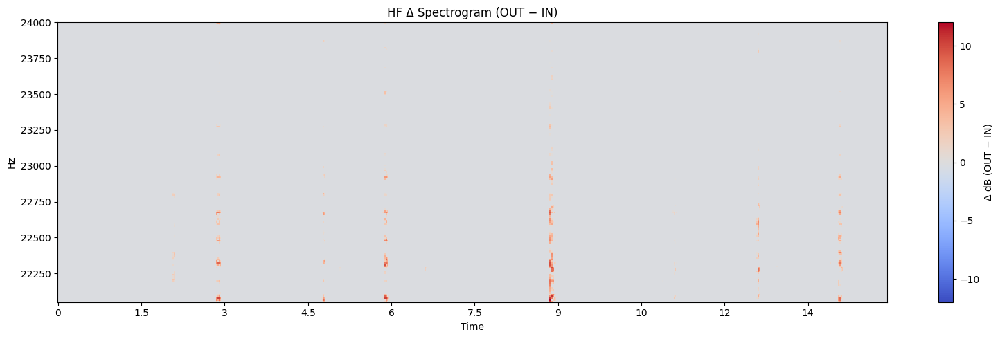


## 2) Average spectrum

**Question:** How far is bandwidth extended, and is the continuation near Nyquist smooth?

**What it shows:** Time-averaged spectra of IN and OUT, with the input Nyquist marked.

**How to read it:**
- Sustained energy beyond Nyquist indicates extension
- Smooth continuation near the boundary is a continuity indicator
- Abrupt bumps/plateaus near Nyquist suggest discontinuity risk


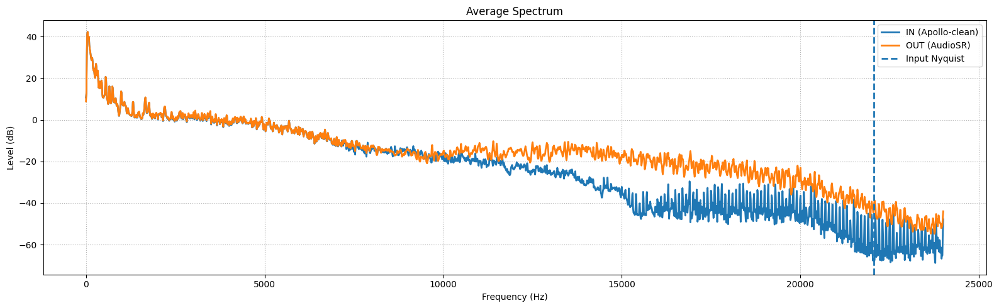


## 3) In-band Δ spectrogram (preservation)

**Question:** Where is the original in-band content modified?

**What it shows:** Δ = OUT − IN in dB for frequencies < input Nyquist.
Differences here reflect modification of existing content.

**How to read it:**
- Near-zero differences: strong preservation
- Localized changes near the upper band edge: boundary adaptation
- Broad changes in low/mid bands: larger in-band alteration

Color scale is clipped to ±6 dB for readability.


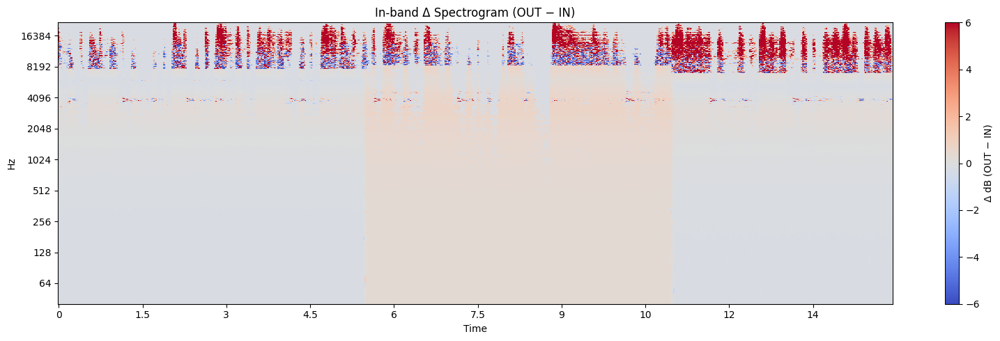


## 4) In-band deviation statistics

**Question:** How large is in-band deviation, excluding near-silence?

Statistics are computed from |Δ dB| in-band, only where IN > -80 dB.


- Mean |Δ dB| (in-band): `2.021`
- Median |Δ dB| (in-band): `0.193`
- 90th percentile |Δ dB| (in-band): `7.351`


---
## Final conclusion

This audit documents (i) whether OUT introduces structured high-frequency energy above the input Nyquist,
and (ii) how much OUT deviates from IN inside the original band. The plots provide the primary evidence,
while the scalar verification values provide compact consistency checks aligned with the same definitions.


In [2]:
#@title AudioSR Bandwidth Extension & Preservation Audit (Apollo → AudioSR)

import numpy as np
import librosa
import librosa.display
import matplotlib.pyplot as plt
from IPython.display import display, Markdown
from scipy.signal import resample_poly
import scipy
import math

# ============================================================
# Inputs
# ============================================================
INPUT_PATH  = "/content/apollo_0.wav"     # @param {"type":"string"}
OUTPUT_PATH = "/content/audiosr_0.wav"    # @param {"type":"string"}

# ============================================================
# Analysis parameters
# ============================================================
N_FFT = 4096
HOP   = 1024
EPS   = 1e-12

TOP_DB = 80.0
SILENCE_DB = -TOP_DB

MAX_SR = 96000
RESAMPLE_WINDOW = ("kaiser", 5.0)

MAX_ALIGN_SEC = 0.05
ALIGN_SEG_SEC = 8.0

STFT_WINDOW = "hann"
STFT_CENTER = False

# ============================================================
# Utilities
# ============================================================
def db(x: np.ndarray) -> np.ndarray:
    return 20.0 * np.log10(np.maximum(x, EPS))

def sanitize(x: np.ndarray) -> np.ndarray:
    return np.nan_to_num(x, nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def resample_to(x: np.ndarray, orig_sr: int, target_sr: int) -> np.ndarray:
    x = sanitize(x)
    if int(orig_sr) == int(target_sr):
        return x
    g = math.gcd(int(orig_sr), int(target_sr))
    up = int(target_sr // g)
    down = int(orig_sr // g)
    y = resample_poly(x, up, down, window=RESAMPLE_WINDOW)
    return sanitize(y)

def choose_lag_min_abs(lags: np.ndarray, scores: np.ndarray) -> int:
    if lags.size == 0:
        return 0
    m = np.max(scores)
    cand = lags[scores == m]
    return int(cand[np.argmin(np.abs(cand))])

def parabolic_refine(lags: np.ndarray, scores: np.ndarray, lag0: int) -> float:
    if lags.size < 3:
        return float(lag0)
    idx = np.where(lags == lag0)[0]
    if idx.size == 0:
        return float(lag0)
    i = int(idx[0])
    if i == 0 or i == lags.size - 1:
        return float(lag0)
    s1, s2, s3 = float(scores[i - 1]), float(scores[i]), float(scores[i + 1])
    denom = (s1 - 2.0 * s2 + s3)
    if abs(denom) < 1e-20:
        return float(lag0)
    delta = 0.5 * (s1 - s3) / denom
    delta = float(np.clip(delta, -0.5, 0.5))
    return float(lag0 + delta)

def fractional_shift_fft(x: np.ndarray, shift_samples: float) -> np.ndarray:
    if abs(shift_samples) < 1e-9:
        return x.astype(np.float32, copy=False)
    x64 = x.astype(np.float64, copy=False)
    pad = int(np.ceil(abs(shift_samples))) + 16
    xpad = np.pad(x64, (pad, pad), mode="constant")
    n = int(1 << int(np.ceil(np.log2(len(xpad) + 1))))
    X = np.fft.rfft(xpad, n=n)
    k = np.arange(X.size, dtype=np.float64)
    phase = np.exp(-2j * np.pi * k * shift_samples / n)
    y = np.fft.irfft(X * phase, n=n)[:len(xpad)]
    y = y[pad:pad + len(x64)]
    return sanitize(y)

def apply_alignment(x_in: np.ndarray, x_out: np.ndarray, lag_samples: float) -> tuple[np.ndarray, np.ndarray]:
    lag_int = int(np.trunc(lag_samples))
    lag_frac = float(lag_samples - lag_int)

    if lag_int > 0:
        x_out = x_out[lag_int:]
        x_in  = x_in[:len(x_out)]
    elif lag_int < 0:
        x_in  = x_in[-lag_int:]
        x_out = x_out[:len(x_in)]

    if abs(lag_frac) > 1e-9:
        if lag_samples > 0:
            x_out = fractional_shift_fft(x_out, -lag_frac)
        elif lag_samples < 0:
            x_in  = fractional_shift_fft(x_in, +lag_frac)

    m = min(len(x_in), len(x_out))
    return x_in[:m], x_out[:m]

# ============================================================
# Load + choose analysis sample rate
# ============================================================
x_in_native,  sr_in  = librosa.load(INPUT_PATH,  sr=None, mono=True)
x_out_native, sr_out = librosa.load(OUTPUT_PATH, sr=None, mono=True)

analysis_sr = int(min(max(sr_in, sr_out), MAX_SR))

x_in  = resample_to(x_in_native,  sr_in,  analysis_sr)
x_out = resample_to(x_out_native, sr_out, analysis_sr)

min_len0 = min(len(x_in), len(x_out))
if min_len0 <= max(N_FFT, 2):
    raise ValueError("Audio too short for stable analysis. Verify input/output paths.")

# ============================================================
# Time alignment (bounded; energetic excerpt; sub-sample refined)
# ============================================================
max_shift = int(MAX_ALIGN_SEC * analysis_sr)

x_in0  = x_in[:min_len0]
x_out0 = x_out[:min_len0]

align_seg_sec = ALIGN_SEG_SEC
if analysis_sr >= 88000:
    align_seg_sec = 2.0
elif analysis_sr >= 48000:
    align_seg_sec = 4.0

rms_frames = librosa.feature.rms(
    y=x_in0,
    frame_length=N_FFT,
    hop_length=HOP,
    center=False
)[0]
peak_frame = int(np.argmax(rms_frames))
peak_sample = peak_frame * HOP

seg_len = int(min(align_seg_sec, min_len0 / analysis_sr) * analysis_sr)
seg_len = min_len0 if min_len0 < int(1.0 * analysis_sr) else seg_len
seg_len = max(1, seg_len)

seg_start = int(np.clip(peak_sample - seg_len // 2, 0, max(0, min_len0 - seg_len)))
seg_end   = seg_start + seg_len

a = x_in0[seg_start:seg_end].astype(np.float64)
b = x_out0[seg_start:seg_end].astype(np.float64)

max_shift = min(max_shift, len(a) - 1) if len(a) > 1 else 0

a = a - np.mean(a)
b = b - np.mean(b)
a = a / (np.sqrt(np.mean(a * a)) + EPS)
b = b / (np.sqrt(np.mean(b * b)) + EPS)

lags = np.arange(-max_shift, max_shift + 1)
scores = np.empty_like(lags, dtype=np.float64)

for i, lag in enumerate(lags):
    if lag >= 0:
        aa = a[:len(a) - lag]
        bb = b[lag:]
    else:
        aa = a[-lag:]
        bb = b[:len(b) + lag]
    scores[i] = float(np.dot(aa, bb) / (len(aa) + EPS))

lag_int = choose_lag_min_abs(lags, scores)
lag_refined = parabolic_refine(lags, scores, lag_int)
lag_refined = float(np.clip(lag_refined, -max_shift, max_shift))

x_in, x_out = apply_alignment(x_in, x_out, lag_refined)
lag_ms = (lag_refined / analysis_sr) * 1000.0

# ============================================================
# STFT and magnitude
# ============================================================
X_in  = librosa.stft(x_in,  n_fft=N_FFT, hop_length=HOP, window=STFT_WINDOW, center=STFT_CENTER)
X_out = librosa.stft(x_out, n_fft=N_FFT, hop_length=HOP, window=STFT_WINDOW, center=STFT_CENTER)

S_in  = np.abs(X_in)
S_out = np.abs(X_out)

freqs = librosa.fft_frequencies(sr=analysis_sr, n_fft=N_FFT)

nyq_in = sr_in / 2.0
hf_rows     = np.where(freqs >= nyq_in)[0]
inband_rows = np.where(freqs <  nyq_in)[0]
hf_available = (analysis_sr / 2.0) > nyq_in and hf_rows.size > 0

# ============================================================
# In-band gain match
# ============================================================
if inband_rows.size:
    p_in  = float(np.mean(np.abs(X_in[inband_rows])**2))
    p_out = float(np.mean(np.abs(X_out[inband_rows])**2)) + EPS
    gain = np.sqrt(p_in / p_out)
else:
    p_in  = float(np.mean(np.abs(X_in)**2))
    p_out = float(np.mean(np.abs(X_out)**2)) + EPS
    gain = np.sqrt(p_in / p_out)

X_out *= gain
S_out = np.abs(X_out)

# ============================================================
# dB mapping and difference
# ============================================================
ref = float(np.max(S_in)) + EPS
D_in   = librosa.amplitude_to_db(S_in,  ref=ref, top_db=TOP_DB)
D_out  = librosa.amplitude_to_db(S_out, ref=ref, top_db=TOP_DB)
D_diff = D_out - D_in

valid_mask_inband = (D_in[inband_rows] > SILENCE_DB) if inband_rows.size else np.array([], dtype=bool)

# ============================================================
# Compact verification (scalars only)
# ============================================================
if inband_rows.size:
    mean_inband_db = np.mean(D_in[inband_rows], axis=1)
    freq_mask = mean_inband_db > SILENCE_DB
    inband_rows_masked = inband_rows[freq_mask]
else:
    inband_rows_masked = np.array([], dtype=int)

if inband_rows_masked.size:
    Pxy = np.mean(X_out[inband_rows_masked] * np.conj(X_in[inband_rows_masked]), axis=1)
    Pxx = np.mean(np.abs(X_in[inband_rows_masked])**2, axis=1) + EPS
    Pyy = np.mean(np.abs(X_out[inband_rows_masked])**2, axis=1) + EPS
    coh_f = (np.abs(Pxy)**2) / (Pxx * Pyy)
    coh_mean = float(np.mean(coh_f))
    coh_p10  = float(np.percentile(coh_f, 10))
else:
    coh_mean, coh_p10 = float("nan"), float("nan")

hf_event_corr = float("nan")
hf_stationarity_db = float("nan")
if inband_rows.size and hf_available:
    inband_env = np.sqrt(np.mean(np.abs(X_in[inband_rows])**2, axis=0))
    hf_env     = np.sqrt(np.mean(np.abs(X_out[hf_rows])**2, axis=0))

    if np.std(inband_env) > 0 and np.std(hf_env) > 0:
        hf_event_corr = float(np.corrcoef(inband_env, hf_env)[0, 1])

    p20 = np.percentile(inband_env, 20)
    p80 = np.percentile(inband_env, 80)
    quiet = inband_env <= p20
    loud  = inband_env >= p80
    if np.any(quiet) and np.any(loud):
        hf_quiet = float(np.median(hf_env[quiet]))
        hf_loud  = float(np.median(hf_env[loud]))
        hf_stationarity_db = float(db(hf_quiet + EPS) - db(hf_loud + EPS))

mean_in  = np.mean(S_in, axis=1)
mean_out = np.mean(S_out, axis=1)
lo1 = 0.85 * nyq_in
hi1 = 0.99 * nyq_in
lo2 = 1.01 * nyq_in
hi2 = 1.20 * nyq_in
idx1 = np.where((freqs >= lo1) & (freqs <= hi1))[0]
idx2 = np.where((freqs >= lo2) & (freqs <= hi2))[0]
boundary_jump_db = (float(np.mean(db(mean_out[idx2]))) - float(np.mean(db(mean_out[idx1])))) if (idx1.size and idx2.size) else float("nan")

# ============================================================
# Context
# ============================================================
dur_sec = float(len(x_in) / analysis_sr)
in_peak = float(np.max(np.abs(x_in)))
out_peak = float(np.max(np.abs(x_out)))

# ============================================================
# Report
# ============================================================
display(Markdown(f"""
# AudioSR Bandwidth Extension & Preservation Audit

## Scope
- IN: Apollo-clean (native SR: {sr_in} Hz)
- OUT: AudioSR output (native SR: {sr_out} Hz)

This audit focuses on two aspects:
1) **Bandwidth extension** above the input Nyquist (≈ {nyq_in:.0f} Hz)
2) **Preservation** of the original in-band content

## Settings (summary)
- Analysis SR: {analysis_sr} Hz
- STFT: N_FFT={N_FFT}, HOP={HOP}, window={STFT_WINDOW}, center={STFT_CENTER}
- dB scale: reference=max(S_IN), top_db={TOP_DB:.0f} dB (floor at {SILENCE_DB:.0f} dB)
- Alignment: bounded to ±{MAX_ALIGN_SEC*1000:.0f} ms; estimated shift {lag_refined:+.3f} samples ({lag_ms:+.3f} ms)
- Level normalization: in-band gain match (band defined by input Nyquist)

## Quick context
- Duration: {dur_sec:.2f} s
- Peak |x|: IN {in_peak:.3f}, OUT {out_peak:.3f}

## Compact verification (scalars)
- In-band coherence (mean): {coh_mean:.4f}
- In-band coherence (p10):  {coh_p10:.4f}
- HF event-correlation:      {hf_event_corr:.4f}
- HF stationarity (quiet−loud): {hf_stationarity_db:.2f} dB
- Boundary jump (above−below Nyquist): {boundary_jump_db:.2f} dB

Environment: numpy {np.__version__}, librosa {librosa.__version__}, scipy {scipy.__version__}
"""))

# ============================================================
# 1) HF Δ spectrogram
# ============================================================
display(Markdown("""
## 1) High-frequency Δ spectrogram (extension evidence)

**Question:** Is energy added above the input Nyquist, and is it time-structured?

**What it shows:** Δ = OUT − IN in dB, displayed only for frequencies ≥ input Nyquist.

**How to read it:**
- Energy rising mainly during musical events/transients suggests event-conditioned extension
- Harmonic/transient-aligned structure is more consistent with signal-driven synthesis
- Diffuse stationary energy is more consistent with noise-like additions

Color scale is clipped to ±12 dB for readability.
"""))

if hf_available:
    plt.figure(figsize=(16, 5))
    ax = plt.gca()
    librosa.display.specshow(
        D_diff,
        sr=analysis_sr,
        hop_length=HOP,
        x_axis="time",
        y_axis="linear",
        cmap="coolwarm",
        vmin=-12,
        vmax=12
    )
    plt.colorbar(label="Δ dB (OUT − IN)")
    ax.set_ylim(nyq_in, analysis_sr / 2)
    plt.title("HF Δ Spectrogram (OUT − IN)")
    plt.tight_layout()
    plt.show()
else:
    display(Markdown("No frequency region exists above the input Nyquist at the current analysis sample rate."))

# ============================================================
# 2) Average spectrum
# ============================================================
display(Markdown("""
## 2) Average spectrum

**Question:** How far is bandwidth extended, and is the continuation near Nyquist smooth?

**What it shows:** Time-averaged spectra of IN and OUT, with the input Nyquist marked.

**How to read it:**
- Sustained energy beyond Nyquist indicates extension
- Smooth continuation near the boundary is a continuity indicator
- Abrupt bumps/plateaus near Nyquist suggest discontinuity risk
"""))

plt.figure(figsize=(16, 5))
plt.plot(freqs, db(mean_in),  label="IN (Apollo-clean)", linewidth=2)
plt.plot(freqs, db(mean_out), label="OUT (AudioSR)", linewidth=2)
plt.axvline(nyq_in, linestyle="--", linewidth=2, label="Input Nyquist")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Level (dB)")
plt.grid(True, ls=":")
plt.legend()
plt.title("Average Spectrum")
plt.tight_layout()
plt.show()

# ============================================================
# 3) In-band Δ spectrogram
# ============================================================
display(Markdown("""
## 3) In-band Δ spectrogram (preservation)

**Question:** Where is the original in-band content modified?

**What it shows:** Δ = OUT − IN in dB for frequencies < input Nyquist.
Differences here reflect modification of existing content.

**How to read it:**
- Near-zero differences: strong preservation
- Localized changes near the upper band edge: boundary adaptation
- Broad changes in low/mid bands: larger in-band alteration

Color scale is clipped to ±6 dB for readability.
"""))

plt.figure(figsize=(16, 5))
ax = plt.gca()
librosa.display.specshow(
    D_diff,
    sr=analysis_sr,
    hop_length=HOP,
    x_axis="time",
    y_axis="log",
    cmap="coolwarm",
    vmin=-6,
    vmax=6
)
plt.colorbar(label="Δ dB (OUT − IN)")
ymin = min(20.0, max(1.0, nyq_in / 10.0))
ax.set_ylim(ymin, nyq_in)
plt.title("In-band Δ Spectrogram (OUT − IN)")
plt.tight_layout()
plt.show()

# ============================================================
# 4) In-band deviation statistics
# ============================================================
display(Markdown(f"""
## 4) In-band deviation statistics

**Question:** How large is in-band deviation, excluding near-silence?

Statistics are computed from |Δ dB| in-band, only where IN > {SILENCE_DB:.0f} dB.
"""))

inband_vals = np.abs(D_diff[inband_rows])[valid_mask_inband] if valid_mask_inband.size else np.array([], dtype=float)
mean_db   = float(np.mean(inband_vals)) if inband_vals.size else float("nan")
median_db = float(np.median(inband_vals)) if inband_vals.size else float("nan")
p90_db    = float(np.percentile(inband_vals, 90)) if inband_vals.size else float("nan")

display(Markdown(
    f"- Mean |Δ dB| (in-band): `{mean_db:.3f}`\n"
    f"- Median |Δ dB| (in-band): `{median_db:.3f}`\n"
    f"- 90th percentile |Δ dB| (in-band): `{p90_db:.3f}`"
))

display(Markdown("""
---
## Final conclusion

This audit documents (i) whether OUT introduces structured high-frequency energy above the input Nyquist,
and (ii) how much OUT deviates from IN inside the original band. The plots provide the primary evidence,
while the scalar verification values provide compact consistency checks aligned with the same definitions.
"""))


# Stereoize & Mastering Analysis


# Stereoize & Mastering Audit

## Scope
- IN: AudioSR output (`audiosr_0.wav`; treated as mono reference)
- OUT: Final master (`master_0.wav`; stereo + loudness-normalized)

This audit documents **net change** from IN to OUT using three targeted checks:
1) **Mastering compliance** (I / TP / LRA via FFmpeg loudnorm measurement)
2) **Stereo field injection shape** (frequency-dependent Side/Mid ratio)
3) **Micro-dynamics preservation** (crest factor over time)

## Settings (summary)
- Analysis SR: 48000 Hz
- Alignment: bounded to ±50 ms; estimated shift -0.000 samples (-0.000 ms) *(analysis-only)*
- Width: Welch nperseg=16384; bass-safe reference at 150 Hz
- Crest factor: win=0.40s, hop=0.10s
- Loudness measurement: FFmpeg loudnorm in "measure" modified

## Quick context
- Duration analyzed (after alignment): 15.00 s

## Compact verification (scalars)
- Loudness (I, LUFS): IN `-14.94` → OUT `-14.00`
- True-peak (dBTP):   IN `-0.42` → OUT `-1.90`
- LRA:                IN `1.00` → OUT `1.00`

- OUT width (mean 20–150 Hz): `-69.97` dB *(bass-side suppression proxy)*
- OUT width (median 300 Hz–8 kHz): `-8.26` dB *(typical stereo field strength)*

- Crest-factor delta (OUT−IN): mean `+0.000` dB; 90th-percentile |Δ| `0.000` dB

Environment: numpy 2.0.2, scipy 1.16.3, soundfile 0.13.1



## 1) Mastering compliance — loudness & true-peak

**Question:** Did OUT reach delivery loudness while keeping true-peak controlled and avoiding unexpected LRA collapse?

**What it shows:** FFmpeg `loudnorm` measurement (I / TP / LRA) on IN and OUT.

**How to read it:**
- I (LUFS) moves toward the delivery region (e.g., ~−14 LUFS for streaming)
- TP (dBTP) remains controlled (peak safety)
- LRA should not collapse unexpectedly (no aggressive dynamics destruction)


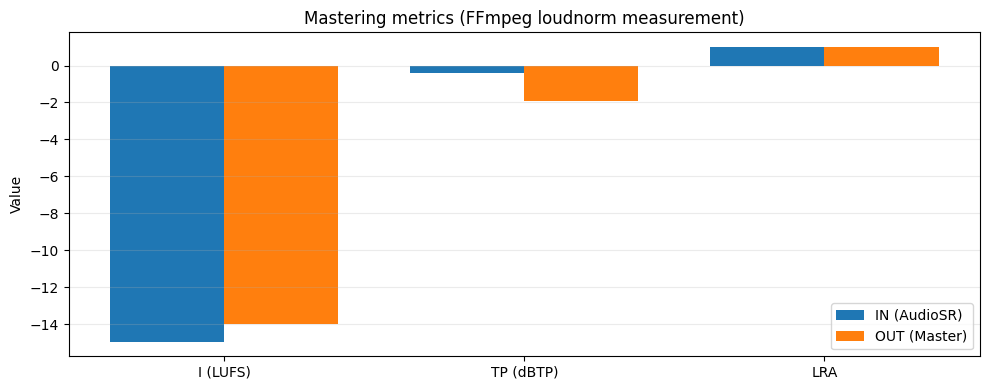


## 2) Stereo field injection — width vs frequency

**Question:** Where (in frequency) is stereo width injected, and is the bass kept mono-safe?

**What it shows:** Frequency-dependent width as `10·log10(Pside/Pmid)` [dB].
- IN is displayed as a **dual-mono reference** (Side≈0 everywhere → curve near the floor).
- OUT shows the **actual injected stereo field**.

**How to read it:**
- Below ~150 Hz, the curve should stay very low (bass-side suppression / mono safety)
- Above the low end, higher values indicate more stereo energy relative to Mid


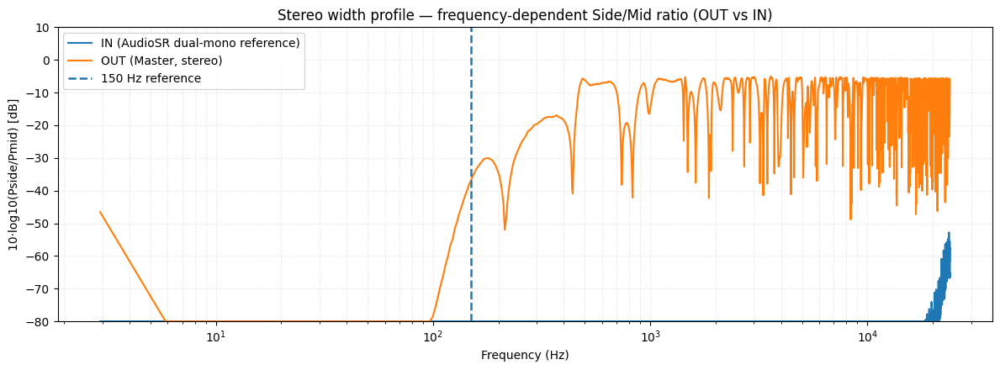


## 3) Micro-dynamics preservation — crest factor over time

**Question:** Did the finalization stage reshape transients (compression/limiting), or mostly apply gain normalization?

**What it shows:** Crest factor = `20·log10(peak/RMS)` on short windows (win=0.40s, hop=0.10s):
- IN: AudioSR mono reference
- OUT: Master **Mid** (so stereo injection does not dominate the dynamics proxy)

**How to read it:**
- If the two curves largely overlap, the chain is mostly **gain/normalization** (crest factor is gain-invariant).
- Persistent separation would indicate **non-linear dynamics** changes (limiting/compression).

**Observed here:** mean Δ=`+0.000` dB, p90 |Δ|=`0.000` dB (consistent with near-perfect overlap).


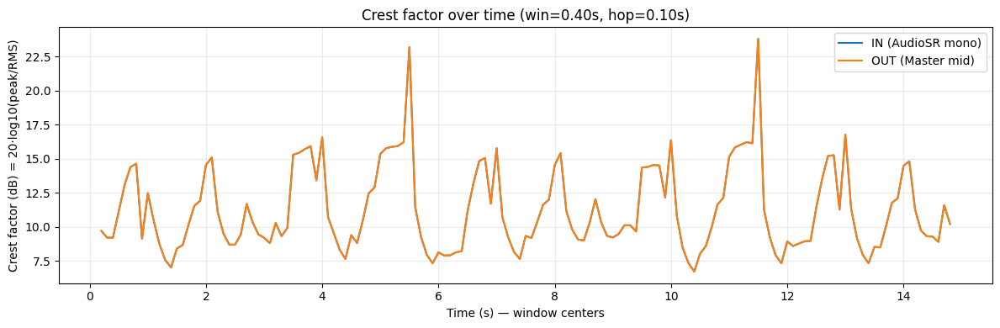


---
## Final conclusion

This audit intentionally avoids redundant plots and focuses on three measurable outcomes:

1) **Mastering metrics** document loudness/true-peak/LRA changes (objective delivery evidence).
2) **Stereo width vs frequency** shows the main structural change from IN (mono reference) to OUT (stereo),
   and verifies bass-side suppression consistent with mono-safe design intent.
3) **Crest factor over time** tests whether the chain introduced non-linear dynamics changes; the observed
   near-perfect overlap (mean and p90 |Δ| reported above) is consistent with normalization-focused mastering
   rather than transient reshaping.


In [5]:
#@title Stereoize & Mastering (AudioSR → Final Master)

import os, re, json, subprocess, warnings
import numpy as np
import soundfile as sf
import matplotlib.pyplot as plt
from scipy import signal
from scipy.signal import resample_poly
from IPython.display import display, Markdown
import scipy
import math

warnings.filterwarnings("ignore")
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "3"

# ============================================================
# Inputs
# ============================================================
INPUT_PATH  = "/content/audiosr_0.wav"   # @param {"type":"string"}
OUTPUT_PATH = "/content/master_0.wav"    # @param {"type":"string"}

# ============================================================
# Analysis parameters
# ============================================================
ANALYSIS_SR = 48000

EPS = 1e-12

# Time alignment
MAX_ALIGN_SEC = 0.05     # ±50 ms
ALIGN_SEG_SEC = 8.0      # energetic excerpt
FRAME_LEN = 4096
HOP = 1024

# Stereo width profile (Side/Mid)
WELCH_NPERSEG = 16384
BASS_SAFE_REF_HZ = 150.0  # mono-safe low-end reference

# Crest factor (micro-dynamics proxy)
CREST_WIN_SEC = 0.40
CREST_HOP_SEC = 0.10

# Loudness measurement (FFmpeg loudnorm in "measure" mode)
MEAS_I   = -14.0
MEAS_TP  = -1.0
MEAS_LRA = 11.0

# ============================================================
# Utilities
# ============================================================
def sanitize(x: np.ndarray) -> np.ndarray:
    return np.nan_to_num(np.asarray(x, dtype=np.float32),
                         nan=0.0, posinf=0.0, neginf=0.0).astype(np.float32, copy=False)

def resample_to(x: np.ndarray, orig_sr: int, target_sr: int) -> np.ndarray:
    x = sanitize(x)
    if int(orig_sr) == int(target_sr):
        return x
    g = math.gcd(int(orig_sr), int(target_sr))
    up = int(target_sr // g)
    down = int(orig_sr // g)
    y = resample_poly(x, up, down, window=("kaiser", 5.0), axis=0)
    return sanitize(y)

def db(x: np.ndarray) -> np.ndarray:
    return 20.0 * np.log10(np.maximum(x, EPS))

def _run_capture(cmd):
    return subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

def _run_quiet(cmd, check=True):
    return subprocess.run(cmd, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=check)

def _ensure_ffmpeg():
    try:
        subprocess.run(["ffmpeg", "-version"], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=True)
    except Exception:
        _run_quiet(["apt-get", "update", "-y"], check=False)
        _run_quiet(["apt-get", "install", "-y", "ffmpeg"], check=False)
        subprocess.run(["ffmpeg", "-version"], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=True)

def _ensure_ffmpeg_filters():
    p = _run_capture(["ffmpeg", "-hide_banner", "-filters"])
    txt = (p.stdout or "") + "\n" + (p.stderr or "")
    if " loudnorm " not in txt and "\nloudnorm" not in txt:
        raise RuntimeError("FFmpeg is present but the loudnorm filter is not available in this build.")

def _extract_last_balanced_json(text: str) -> dict:
    s = text or ""
    starts = [m.start() for m in re.finditer(r"\{", s)]
    if not starts:
        return {}
    for st in reversed(starts[-250:]):
        depth = 0
        ed = None
        for i in range(st, len(s)):
            c = s[i]
            if c == "{":
                depth += 1
            elif c == "}":
                depth -= 1
                if depth == 0:
                    ed = i
                    break
        if ed is None:
            continue
        blob = s[st:ed + 1]
        try:
            obj = json.loads(blob)
            if isinstance(obj, dict) and ("input_i" in obj) and ("input_tp" in obj) and ("input_lra" in obj):
                return obj
        except Exception:
            continue
    return {}

def measure_loudnorm(path: str) -> dict:
    cmd = [
        "ffmpeg", "-hide_banner", "-nostats", "-y", "-nostdin",
        "-i", path,
        "-af", f"loudnorm=I={MEAS_I}:TP={MEAS_TP}:LRA={MEAS_LRA}:print_format=json",
        "-f", "null", "-"
    ]
    p = _run_capture(cmd)
    obj = _extract_last_balanced_json(p.stderr)
    if not obj:
        tail = (p.stderr or "")[-2200:]
        raise RuntimeError("FFmpeg loudnorm measurement failed.\n\n" + tail)
    return obj

def as_float(x):
    try:
        return float(x)
    except Exception:
        return float("nan")

def mono_mixdown(x2: np.ndarray) -> np.ndarray:
    x2 = sanitize(x2)
    if x2.ndim != 2 or x2.shape[1] == 0:
        return sanitize(np.zeros((x2.shape[0],), dtype=np.float32))
    return sanitize(np.mean(x2[:, :min(2, x2.shape[1])], axis=1))

def mid_side_from_stereo(x2: np.ndarray):
    x2 = sanitize(x2)
    if x2.ndim != 2 or x2.shape[1] < 2:
        m = mono_mixdown(x2)
        s = sanitize(np.zeros_like(m))
        return m, s
    L = x2[:, 0]
    R = x2[:, 1]
    mid  = sanitize(0.5 * (L + R))
    side = sanitize(0.5 * (L - R))
    return mid, side

def width_profile_db(mid: np.ndarray, side: np.ndarray, sr: int):
    nperseg = int(min(WELCH_NPERSEG, len(mid)))
    if nperseg < 512:
        return np.array([0.0], dtype=np.float32), np.array([-80.0], dtype=np.float32)

    f, Pm = signal.welch(mid.astype(np.float32, copy=False),  fs=sr, nperseg=nperseg)
    _, Ps = signal.welch(side.astype(np.float32, copy=False), fs=sr, nperseg=nperseg)

    ratio_db = 10.0 * np.log10((Ps + 1e-18) / (Pm + 1e-18))
    ratio_db = np.clip(ratio_db, -80.0, 10.0).astype(np.float32)
    return f.astype(np.float32), ratio_db

def crest_factor_db(x: np.ndarray, sr: int, win_s: float, hop_s: float):
    x = sanitize(x).astype(np.float32, copy=False)
    w = int(round(win_s * sr))
    h = max(1, int(round(hop_s * sr)))
    if len(x) < w:
        peak = float(np.max(np.abs(x))) + EPS
        rms  = float(np.sqrt(np.mean(x * x) + EPS))
        return np.array([0.5 * len(x) / sr], dtype=np.float32), np.array([20.0*np.log10(peak/rms)], dtype=np.float32)

    t, c = [], []
    for s in range(0, len(x) - w + 1, h):
        seg = x[s:s+w]
        peak = float(np.max(np.abs(seg))) + EPS
        rms  = float(np.sqrt(np.mean(seg * seg) + EPS))
        t.append((s + 0.5*w) / sr)
        c.append(20.0 * np.log10(peak / rms))
    return np.asarray(t, dtype=np.float32), np.asarray(c, dtype=np.float32)

# --- alignment helpers (analysis-only, bounded; sub-sample refined) ---
def choose_lag_min_abs(lags: np.ndarray, scores: np.ndarray) -> int:
    if lags.size == 0:
        return 0
    m = np.max(scores)
    cand = lags[scores == m]
    return int(cand[np.argmin(np.abs(cand))])

def parabolic_refine(lags: np.ndarray, scores: np.ndarray, lag0: int) -> float:
    if lags.size < 3:
        return float(lag0)
    idx = np.where(lags == lag0)[0]
    if idx.size == 0:
        return float(lag0)
    i = int(idx[0])
    if i == 0 or i == lags.size - 1:
        return float(lag0)

    s1, s2, s3 = float(scores[i - 1]), float(scores[i]), float(scores[i + 1])
    denom = (s1 - 2.0 * s2 + s3)
    if abs(denom) < 1e-20:
        return float(lag0)

    delta = 0.5 * (s1 - s3) / denom
    delta = float(np.clip(delta, -0.5, 0.5))
    return float(lag0 + delta)

def fractional_shift_fft_1d(x: np.ndarray, shift_samples: float) -> np.ndarray:
    if abs(shift_samples) < 1e-9:
        return x.astype(np.float32, copy=False)

    x64 = x.astype(np.float64, copy=False)
    pad = int(np.ceil(abs(shift_samples))) + 16
    xpad = np.pad(x64, (pad, pad), mode="constant")

    n = int(1 << int(np.ceil(np.log2(len(xpad) + 1))))
    X = np.fft.rfft(xpad, n=n)
    k = np.arange(X.size, dtype=np.float64)
    phase = np.exp(-2j * np.pi * k * shift_samples / n)

    y = np.fft.irfft(X * phase, n=n)[:len(xpad)]
    y = y[pad:pad + len(x64)]
    return sanitize(y)

def fractional_shift_fft_2d(x2: np.ndarray, shift_samples: float) -> np.ndarray:
    x2 = sanitize(x2)
    if x2.ndim != 2 or x2.shape[1] == 0 or abs(shift_samples) < 1e-9:
        return x2.astype(np.float32, copy=False)
    y = np.empty_like(x2, dtype=np.float32)
    for ch in range(x2.shape[1]):
        y[:, ch] = fractional_shift_fft_1d(x2[:, ch], shift_samples)
    return y

def apply_alignment_2d(x_in2: np.ndarray, x_out2: np.ndarray, lag_samples: float):
    # Align OUT to IN, applying the same trim/shift to all channels.
    lag_int = int(np.trunc(lag_samples))
    lag_frac = float(lag_samples - lag_int)

    if lag_int > 0:
        x_out2 = x_out2[lag_int:, :]
        x_in2  = x_in2[:x_out2.shape[0], :]
    elif lag_int < 0:
        x_in2  = x_in2[-lag_int:, :]
        x_out2 = x_out2[:x_in2.shape[0], :]

    if abs(lag_frac) > 1e-9:
        if lag_samples > 0:
            x_out2 = fractional_shift_fft_2d(x_out2, -lag_frac)
        elif lag_samples < 0:
            x_in2  = fractional_shift_fft_2d(x_in2, +lag_frac)

    m = min(x_in2.shape[0], x_out2.shape[0])
    return x_in2[:m, :], x_out2[:m, :]

def st_rms(x: np.ndarray, frame_len: int, hop: int):
    x = sanitize(x).astype(np.float32, copy=False)
    n = len(x)
    if n < frame_len + 2:
        return np.zeros(1, dtype=np.float32)
    n_frames = 1 + (n - frame_len) // hop
    out = np.empty(n_frames, dtype=np.float32)
    for i in range(n_frames):
        a = i * hop
        seg = x[a:a+frame_len]
        out[i] = float(np.sqrt(np.mean(seg * seg) + EPS))
    return out

# ============================================================
# Load + resample
# ============================================================
if not os.path.exists(INPUT_PATH):
    raise FileNotFoundError(f"Input file not found: {INPUT_PATH}")
if not os.path.exists(OUTPUT_PATH):
    raise FileNotFoundError(f"Output file not found: {OUTPUT_PATH}")

x_in,  sr_in  = sf.read(INPUT_PATH,  always_2d=True)
x_out, sr_out = sf.read(OUTPUT_PATH, always_2d=True)

x_in  = resample_to(x_in,  int(sr_in),  ANALYSIS_SR)
x_out = resample_to(x_out, int(sr_out), ANALYSIS_SR)

m0 = int(min(x_in.shape[0], x_out.shape[0]))
if m0 < int(0.5 * ANALYSIS_SR):
    raise RuntimeError("Audio too short for stable audit. Verify paths and render length.")
x_in  = x_in[:m0]
x_out = x_out[:m0]

# ============================================================
# Time alignment (analysis-only; bounded; energetic excerpt)
# Align IN mono reference against OUT mid to avoid spurious differences.
# ============================================================
in_mono0 = mono_mixdown(x_in)
out_mid0, _ = mid_side_from_stereo(x_out)

max_shift = int(MAX_ALIGN_SEC * ANALYSIS_SR)

rms_frames = st_rms(in_mono0, FRAME_LEN, HOP)
peak_frame = int(np.argmax(rms_frames))
peak_sample = peak_frame * HOP

seg_len = int(min(ALIGN_SEG_SEC, m0 / ANALYSIS_SR) * ANALYSIS_SR)
seg_len = m0 if m0 < int(1.0 * ANALYSIS_SR) else seg_len
seg_len = max(1, seg_len)

seg_start = int(np.clip(peak_sample - seg_len // 2, 0, max(0, m0 - seg_len)))
seg_end   = seg_start + seg_len

a = in_mono0[seg_start:seg_end].astype(np.float64)
b = out_mid0[seg_start:seg_end].astype(np.float64)

max_shift = min(max_shift, len(a) - 1) if len(a) > 1 else 0

a = a - np.mean(a)
b = b - np.mean(b)
a = a / (np.sqrt(np.mean(a * a)) + EPS)
b = b / (np.sqrt(np.mean(b * b)) + EPS)

lags = np.arange(-max_shift, max_shift + 1)
scores = np.empty_like(lags, dtype=np.float64)

for i, lag in enumerate(lags):
    if lag >= 0:
        aa = a[:len(a) - lag]
        bb = b[lag:]
    else:
        aa = a[-lag:]
        bb = b[:len(b) + lag]
    scores[i] = float(np.dot(aa, bb) / (len(aa) + EPS))

lag_int = choose_lag_min_abs(lags, scores)
lag_refined = parabolic_refine(lags, scores, lag_int)
lag_refined = float(np.clip(lag_refined, -max_shift, max_shift))
lag_ms = (lag_refined / ANALYSIS_SR) * 1000.0

# Apply alignment to full signals (analysis only)
x_in, x_out = apply_alignment_2d(x_in, x_out, lag_refined)

dur_sec = float(x_in.shape[0] / ANALYSIS_SR)

# References used in this audit (after alignment)
in_mono = mono_mixdown(x_in)
out_mid, out_side = mid_side_from_stereo(x_out)

# IN as "dual-mono stereo" for width visualization (Side=0 => floor)
in_mid  = in_mono
in_side = sanitize(np.zeros_like(in_mid))

# ============================================================
# Loudness metrics (FFmpeg loudnorm measurement; measured on files)
# ============================================================
_ensure_ffmpeg()
_ensure_ffmpeg_filters()

meas_in  = measure_loudnorm(INPUT_PATH)
meas_out = measure_loudnorm(OUTPUT_PATH)

I_in   = as_float(meas_in.get("input_i"))
TP_in  = as_float(meas_in.get("input_tp"))
LRA_in = as_float(meas_in.get("input_lra"))

I_out   = as_float(meas_out.get("input_i"))
TP_out  = as_float(meas_out.get("input_tp"))
LRA_out = as_float(meas_out.get("input_lra"))

# ============================================================
# Stereo width (Side/Mid) vs frequency
# ============================================================
f_in,  w_in  = width_profile_db(in_mid,  in_side,  ANALYSIS_SR)
f_out, w_out = width_profile_db(out_mid, out_side, ANALYSIS_SR)

def band_stat(f, y, f_lo, f_hi, stat="mean"):
    mask = (f >= float(f_lo)) & (f <= float(f_hi))
    if not np.any(mask):
        return float("nan")
    v = y[mask].astype(np.float64)
    return float(np.median(v)) if stat == "median" else float(np.mean(v))

low_width_out = band_stat(f_out, w_out, 20.0, 150.0, stat="mean")
mid_width_out = band_stat(f_out, w_out, 300.0, 8000.0, stat="median")

# ============================================================
# Crest factor (micro-dynamics proxy)
# ============================================================
t_in,  c_in  = crest_factor_db(in_mono, ANALYSIS_SR, CREST_WIN_SEC, CREST_HOP_SEC)
t_out, c_out = crest_factor_db(out_mid, ANALYSIS_SR, CREST_WIN_SEC, CREST_HOP_SEC)

t = t_in if t_in.size >= t_out.size else t_out
c_in_i  = np.interp(t, t_in,  c_in)  if t_in.size  > 1 else np.full_like(t, c_in[0])
c_out_i = np.interp(t, t_out, c_out) if t_out.size > 1 else np.full_like(t, c_out[0])

dC = (c_out_i - c_in_i).astype(np.float32)
dC_mean = float(np.mean(dC))
dC_p90  = float(np.percentile(np.abs(dC), 90))

# ============================================================
# Report
# ============================================================
display(Markdown(f"""
# Stereoize & Mastering Audit

## Scope
- IN: AudioSR output (`{os.path.basename(INPUT_PATH)}`; treated as mono reference)
- OUT: Final master (`{os.path.basename(OUTPUT_PATH)}`; stereo + loudness-normalized)

This audit documents **net change** from IN to OUT using three targeted checks:
1) **Mastering compliance** (I / TP / LRA via FFmpeg loudnorm measurement)
2) **Stereo field injection shape** (frequency-dependent Side/Mid ratio)
3) **Micro-dynamics preservation** (crest factor over time)

## Settings (summary)
- Analysis SR: {ANALYSIS_SR} Hz
- Alignment: bounded to ±{MAX_ALIGN_SEC*1000:.0f} ms; estimated shift {lag_refined:+.3f} samples ({lag_ms:+.3f} ms) *(analysis-only)*
- Width: Welch nperseg={WELCH_NPERSEG}; bass-safe reference at {BASS_SAFE_REF_HZ:.0f} Hz
- Crest factor: win={CREST_WIN_SEC:.2f}s, hop={CREST_HOP_SEC:.2f}s
- Loudness measurement: FFmpeg loudnorm in "measure" modified

## Quick context
- Duration analyzed (after alignment): {dur_sec:.2f} s

## Compact verification (scalars)
- Loudness (I, LUFS): IN `{I_in:.2f}` → OUT `{I_out:.2f}`
- True-peak (dBTP):   IN `{TP_in:.2f}` → OUT `{TP_out:.2f}`
- LRA:                IN `{LRA_in:.2f}` → OUT `{LRA_out:.2f}`

- OUT width (mean 20–150 Hz): `{low_width_out:.2f}` dB *(bass-side suppression proxy)*
- OUT width (median 300 Hz–8 kHz): `{mid_width_out:.2f}` dB *(typical stereo field strength)*

- Crest-factor delta (OUT−IN): mean `{dC_mean:+.3f}` dB; 90th-percentile |Δ| `{dC_p90:.3f}` dB

Environment: numpy {np.__version__}, scipy {scipy.__version__}, soundfile {sf.__version__}
"""))

# ============================================================
# 1) Mastering metrics
# ============================================================
display(Markdown("""
## 1) Mastering compliance — loudness & true-peak

**Question:** Did OUT reach delivery loudness while keeping true-peak controlled and avoiding unexpected LRA collapse?

**What it shows:** FFmpeg `loudnorm` measurement (I / TP / LRA) on IN and OUT.

**How to read it:**
- I (LUFS) moves toward the delivery region (e.g., ~−14 LUFS for streaming)
- TP (dBTP) remains controlled (peak safety)
- LRA should not collapse unexpectedly (no aggressive dynamics destruction)
"""))

labels = ["I (LUFS)", "TP (dBTP)", "LRA"]
v_in   = [I_in, TP_in, LRA_in]
v_out  = [I_out, TP_out, LRA_out]

x = np.arange(len(labels))
w = 0.38
plt.figure(figsize=(10, 4))
plt.bar(x - w/2, v_in,  width=w, label="IN (AudioSR)")
plt.bar(x + w/2, v_out, width=w, label="OUT (Master)")
plt.xticks(x, labels)
plt.ylabel("Value")
plt.title("Mastering metrics (FFmpeg loudnorm measurement)")
plt.grid(True, axis="y", alpha=0.25)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# ============================================================
# 2) Stereo width vs frequency
# ============================================================
display(Markdown(f"""
## 2) Stereo field injection — width vs frequency

**Question:** Where (in frequency) is stereo width injected, and is the bass kept mono-safe?

**What it shows:** Frequency-dependent width as `10·log10(Pside/Pmid)` [dB].
- IN is displayed as a **dual-mono reference** (Side≈0 everywhere → curve near the floor).
- OUT shows the **actual injected stereo field**.

**How to read it:**
- Below ~{BASS_SAFE_REF_HZ:.0f} Hz, the curve should stay very low (bass-side suppression / mono safety)
- Above the low end, higher values indicate more stereo energy relative to Mid
"""))

plt.figure(figsize=(12, 4.5))
plt.semilogx(f_in[1:],  w_in[1:],  label="IN (AudioSR dual-mono reference)")
plt.semilogx(f_out[1:], w_out[1:], label="OUT (Master, stereo)")
plt.axvline(BASS_SAFE_REF_HZ, linestyle="--", linewidth=1.8, label=f"{BASS_SAFE_REF_HZ:.0f} Hz reference")
plt.ylim(-80, 10)
plt.xlabel("Frequency (Hz)")
plt.ylabel("10·log10(Pside/Pmid) [dB]")
plt.title("Stereo width profile — frequency-dependent Side/Mid ratio (OUT vs IN)")
plt.grid(True, which="both", ls=":", alpha=0.4)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# ============================================================
# 3) Crest factor over time (micro-dynamics preservation)
# ============================================================
display(Markdown(f"""
## 3) Micro-dynamics preservation — crest factor over time

**Question:** Did the finalization stage reshape transients (compression/limiting), or mostly apply gain normalization?

**What it shows:** Crest factor = `20·log10(peak/RMS)` on short windows (win={CREST_WIN_SEC:.2f}s, hop={CREST_HOP_SEC:.2f}s):
- IN: AudioSR mono reference
- OUT: Master **Mid** (so stereo injection does not dominate the dynamics proxy)

**How to read it:**
- If the two curves largely overlap, the chain is mostly **gain/normalization** (crest factor is gain-invariant).
- Persistent separation would indicate **non-linear dynamics** changes (limiting/compression).

**Observed here:** mean Δ=`{dC_mean:+.3f}` dB, p90 |Δ|=`{dC_p90:.3f}` dB (consistent with near-perfect overlap).
"""))

plt.figure(figsize=(12, 4))
plt.plot(t, c_in_i,  label="IN (AudioSR mono)")
plt.plot(t, c_out_i, label="OUT (Master mid)")
plt.xlabel("Time (s) — window centers")
plt.ylabel("Crest factor (dB) = 20·log10(peak/RMS)")
plt.title(f"Crest factor over time (win={CREST_WIN_SEC:.2f}s, hop={CREST_HOP_SEC:.2f}s)")
plt.grid(True, alpha=0.25)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

display(Markdown("""
---
## Final conclusion

This audit intentionally avoids redundant plots and focuses on three measurable outcomes:

1) **Mastering metrics** document loudness/true-peak/LRA changes (objective delivery evidence).
2) **Stereo width vs frequency** shows the main structural change from IN (mono reference) to OUT (stereo),
   and verifies bass-side suppression consistent with mono-safe design intent.
3) **Crest factor over time** tests whether the chain introduced non-linear dynamics changes; the observed
   near-perfect overlap (mean and p90 |Δ| reported above) is consistent with normalization-focused mastering
   rather than transient reshaping.
"""))


# GLOBAL ANALYSIS


# Pipeline summary (Radar + Heatmap + Spectrum)

Pipeline: MusicGen → (pre-conditioning) → Apollo → AudioSR → (stereoize) → Master

All indices are **0–100** using **fixed declared scales** (not min/max on these four tracks).
Index mapping uses linear normalization on a declared range:
`Index = 100 · clamp((x − vmin) / (vmax − vmin), 0, 1)`.

## Metric definitions (short, readable)

- **Hi-Freq Ext (16–24k / 20–16k)**
  Energy ratio above 16 kHz vs the main band (20 Hz–16 kHz), computed on mono after resampling to **48000 Hz** (Nyquist 24 kHz).
  **Higher** means relatively more high-frequency extension.

- **Stereo (M/S width)**
  `10·log10(Es/Em)` with `M=(L+R)/2`, `S=(L−R)/2`.
  **Higher** means a wider stereo image.

- **HF Contrast (Air vs residue)**
  `HF Contrast = (Hi-Freq Ext) − (Quiet-HF residue)` (dB).
  Quiet-HF residue is measured on **quiet frames** (lowest 20% by 20–8 kHz energy) as `10·log10(E[10–16k]/E[20–8k])`.
  **Higher** means more “air” relative to HF residue in quiet moments.
  **Why “stable is good”**: if you add extension while the quiet HF bed does not rise, the contrast stays high/stable — indicating “air” without persistent HF hiss.

- **Loudness (Integrated LUFS)**
  Integrated loudness from **FFmpeg loudnorm** (EBU R128 / ITU-R BS.1770).
  Shown as a comparable axis (absolute level). It is **not** used in Overall.

- **Overall**
  Mean of **Hi-Freq Ext + Stereo + HF Contrast** (excludes loudness).


## 1) Radar (main) + Overall (compact)

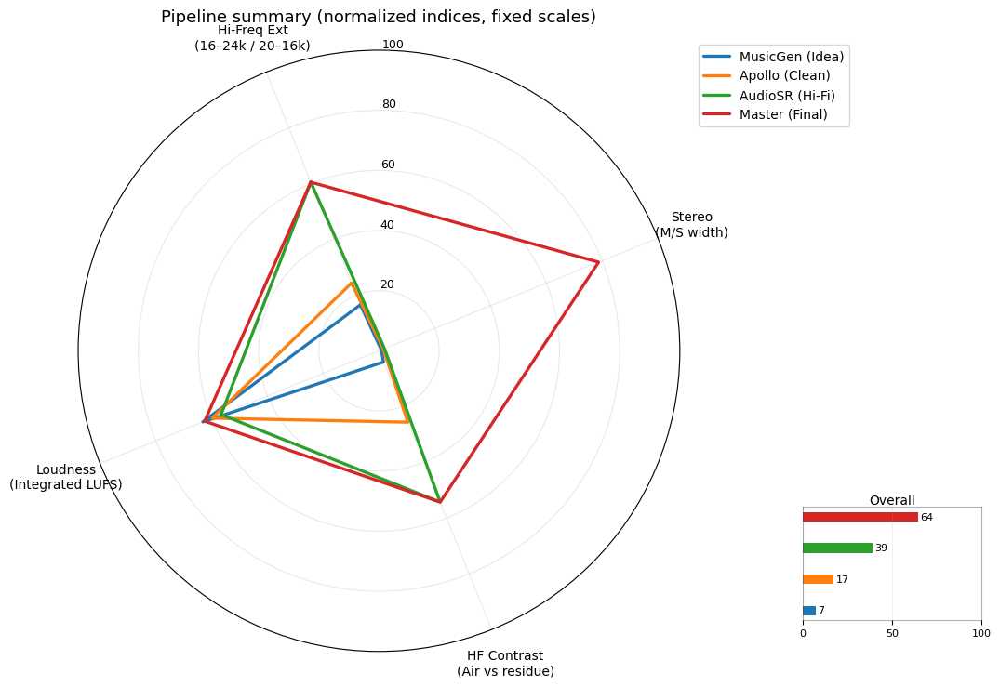

## 2) Heatmap (same indices, 0–100)

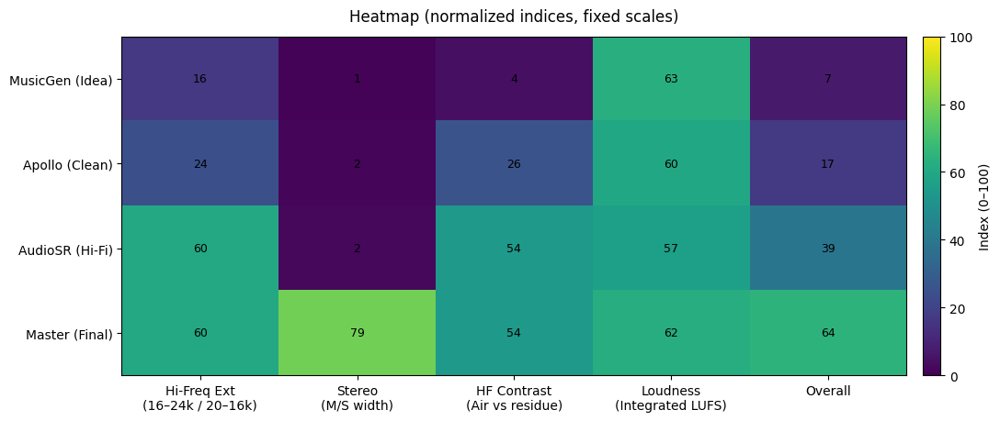


## 3) Average spectrum — Welch PSD (linear frequency)

Resampled to 96000 Hz for a consistent axis up to 30 kHz.
Curves are **gain-matched in 20–16 kHz**.


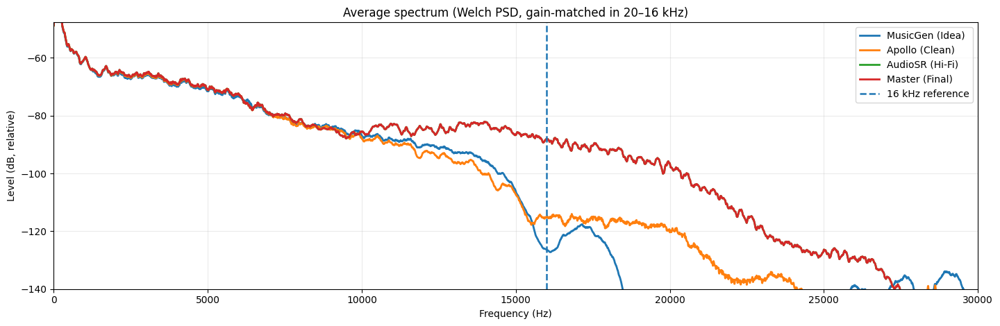

---
## Listening references (players)

**MusicGen (Idea)** — `musicgen_0.wav`

**Apollo (Clean)** — `apollo_0.wav`

**AudioSR (Hi-Fi)** — `audiosr_0.wav`

**Master (Final)** — `master_0.wav`

In [6]:
#@title Pipeline summary
!pip -q install soundfile librosa scipy pandas matplotlib

import os, re, json, subprocess, platform
import numpy as np
import pandas as pd
import soundfile as sf
import librosa
import scipy
import matplotlib
import matplotlib.pyplot as plt

from scipy.signal import welch, resample_poly
from IPython.display import display, Markdown, Audio

EPS = 1e-12

# =========================
# Inputs
# =========================

MUSICGEN_PATH  = "/content/musicgen_0.wav"   # @param {"type":"string"}
APOLLO_PATH  = "/content/apollo_0.wav"   # @param {"type":"string"}
AUDIOSR_PATH  = "/content/audiosr_0.wav"   # @param {"type":"string"}
MASTER_PATH  = "/content/master_0.wav"   # @param {"type":"string"}


TRACKS = [
    ("MusicGen (Idea)", MUSICGEN_PATH),
    ("Apollo (Clean)",  APOLLO_PATH),
    ("AudioSR (Hi-Fi)", AUDIOSR_PATH),
    ("Master (Final)",  MASTER_PATH),
]
ORDER = [t[0] for t in TRACKS]

PIPELINE_STR = "MusicGen → (pre-conditioning) → Apollo → AudioSR → (stereoize) → Master"

COLOR = {
    "MusicGen (Idea)": "#1f77b4",
    "Apollo (Clean)":  "#ff7f0e",
    "AudioSR (Hi-Fi)": "#2ca02c",
    "Master (Final)":  "#d62728",
}

# =========================
# Audit / debug
# =========================
SHOW_RAW_DEBUG = False   # set True to print raw dB values used by indices (for appendix / sanity)
WARN_ON_NAN    = True    # warn if any metric becomes NaN and would be mapped to 0

# =========================
# Core settings
# =========================
# Metrics SR: need 16–24 kHz band -> SR >= 48 kHz
METRIC_SR = 48000

# Spectrum SR/axis: show up to 30 kHz -> SR >= 60 kHz
SPECTRUM_SR   = 96000
SPECTRUM_FMAX = 30000.0
SPECTRUM_YMIN = -140.0

# Gain-match band for spectrum (keeps comparisons fair)
GAINMATCH_LO = 20.0
GAINMATCH_HI = 16000.0

# Mild smoothing in Hz (visual only)
SMOOTH_HZ = 180.0

# Loudnorm measurement (EBU R128 / ITU-R BS.1770 via ffmpeg loudnorm)
# NOTE: these parameters are required by loudnorm; we read the INPUT measurements from its JSON.
LOUDNORM_REF_I   = -14.0
LOUDNORM_REF_TP  = -1.0
LOUDNORM_REF_LRA = 11.0

# =========================
# Fixed scales (0–100)
# Loudness is shown as a comparable axis (absolute level), NOT used for Overall.
# =========================
SCALES = {
    "Hi-Freq Ext\n(16–24k / 20–16k)": ("hf_ext_ratio_db",   -80.0, -20.0),   # higher => more HF extension
    "Stereo\n(M/S width)":           ("stereo_width_ms_db", -110.0,   0.0),  # higher => wider
    # HF Contrast is (Hi-Freq Ext) - (Quiet-HF residue); see function below.
    "HF Contrast\n(Air vs residue)": ("hf_contrast_db",     -40.0,   0.0),   # higher => more "air" relative to quiet residue
    "Loudness\n(Integrated LUFS)":   ("integrated_lufs",     -24.0,  -8.0),  # higher => louder (display axis)
}
RADAR_AXES = list(SCALES.keys())

# Overall: mean of "quality-ish" indices only (exclude loudness)
OVERALL_AXES = [
    "Hi-Freq Ext\n(16–24k / 20–16k)",
    "Stereo\n(M/S width)",
    "HF Contrast\n(Air vs residue)",
]

# =========================
# Utilities
# =========================
def _run_capture(cmd):
    return subprocess.run(cmd, stdout=subprocess.PIPE, stderr=subprocess.PIPE, text=True)

def _ensure_ffmpeg_loudnorm():
    subprocess.run(["ffmpeg", "-version"], stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL, check=True)
    p = _run_capture(["ffmpeg", "-hide_banner", "-filters"])
    txt = (p.stdout or "") + "\n" + (p.stderr or "")
    if " loudnorm " not in txt and "\nloudnorm" not in txt:
        raise RuntimeError("FFmpeg is present but loudnorm filter is not available in this build.")

def _extract_last_balanced_json(text: str) -> dict:
    s = text or ""
    starts = [m.start() for m in re.finditer(r"\{", s)]
    if not starts:
        return {}
    for st in reversed(starts[-300:]):
        depth = 0
        ed = None
        for i in range(st, len(s)):
            c = s[i]
            if c == "{": depth += 1
            elif c == "}":
                depth -= 1
                if depth == 0:
                    ed = i
                    break
        if ed is None:
            continue
        blob = s[st:ed+1]
        try:
            obj = json.loads(blob)
            if isinstance(obj, dict) and (("input_i" in obj) or ("measured_I" in obj)):
                return obj
        except Exception:
            continue
    return {}

def ffmpeg_loudnorm_measure(path):
    cmd = [
        "ffmpeg", "-hide_banner", "-nostats", "-nostdin", "-y",
        "-i", path,
        "-af", f"loudnorm=I={LOUDNORM_REF_I}:TP={LOUDNORM_REF_TP}:LRA={LOUDNORM_REF_LRA}:print_format=json",
        "-f", "null", "-"
    ]
    p = _run_capture(cmd)
    obj = _extract_last_balanced_json(p.stderr)
    if not obj:
        raise RuntimeError("Could not extract loudnorm JSON. stderr tail:\n" + (p.stderr or "")[-1200:])

    def pick(*keys):
        for k in keys:
            if k in obj:
                return obj[k]
        return None

    I   = pick("input_i", "measured_I", "i", "input_I")
    TP  = pick("input_tp", "measured_TP", "tp", "input_TP")
    LRA = pick("input_lra", "measured_LRA", "lra", "input_LRA")
    if I is None or TP is None or LRA is None:
        raise RuntimeError(f"Unexpected loudnorm JSON keys: {list(obj.keys())}")

    return float(I), float(TP), float(LRA)

def load_audio(path):
    if not os.path.exists(path):
        raise FileNotFoundError(f"File not found: {path}")
    y, sr = sf.read(path, dtype="float32", always_2d=True)
    peak = float(np.max(np.abs(y))) if y.size else 0.0
    dur = float(len(y)/sr) if sr else 0.0
    return y, int(sr), int(y.shape[1]), dur, peak

def to_mono(y2):
    return np.mean(y2, axis=1) if y2.ndim == 2 else y2

def resample_audio(y, sr, target_sr):
    if int(sr) == int(target_sr):
        return y
    g = np.gcd(int(sr), int(target_sr))
    up = int(target_sr // g)
    down = int(sr // g)
    if y.ndim == 1:
        return resample_poly(y, up=up, down=down)
    out = [resample_poly(y[:, ch], up=up, down=down) for ch in range(y.shape[1])]
    m = min(len(a) for a in out)
    return np.stack([a[:m] for a in out], axis=1)

def stereo_width_ms_db(y):
    if y.shape[1] < 2:
        L = y[:, 0]; R = y[:, 0]
    else:
        L = y[:, 0]; R = y[:, 1]
    M = 0.5*(L+R)
    S = 0.5*(L-R)
    Em = float(np.mean(M*M) + EPS)
    Es = float(np.mean(S*S) + EPS)
    return float(10.0*np.log10(Es/Em))

def welch_band_energy(mono, sr, f_lo, f_hi):
    nperseg = int(min(len(mono), 32768))
    nperseg = max(1024, nperseg)
    f, Pxx = welch(mono.astype(np.float64, copy=False),
                   fs=sr, window="hann", nperseg=nperseg, noverlap=nperseg//2, scaling="density")
    mask = (f >= float(f_lo)) & (f <= float(f_hi))
    if not np.any(mask):
        return 0.0
    return float(np.trapz(Pxx[mask], f[mask]))

def hf_ext_ratio_db(mono, sr):
    # 10·log10(E[16–24k] / E[20–16k]) at METRIC_SR (Nyquist 24k)
    Ein = welch_band_energy(mono, sr, 20.0, 16000.0)
    Ehf = welch_band_energy(mono, sr, 16000.0, 24000.0)
    return float(10.0*np.log10((Ehf + EPS) / (Ein + EPS)))

def quiet_hf_ratio_db(mono, sr):
    """
    Quiet-HF residue proxy (raw; more negative = cleaner):
    - compute STFT power
    - define quiet frames as lowest 20% in-band energy (20–8k)
    - ratio: 10·log10(E[10–16k] / E[20–8k]) on quiet frames
    """
    n_fft = 4096
    hop = 1024
    if len(mono) < n_fft + hop:
        return float("nan")

    X = librosa.stft(mono, n_fft=n_fft, hop_length=hop, window="hann", center=False)
    P = np.abs(X)**2
    freqs = librosa.fft_frequencies(sr=sr, n_fft=n_fft)

    mid = (freqs >= 20.0) & (freqs <= 8000.0)
    hf  = (freqs >= 10000.0) & (freqs <= 16000.0)
    if (not np.any(mid)) or (not np.any(hf)) or P.shape[1] < 4:
        return float("nan")

    env = np.sqrt(np.mean(P[mid, :], axis=0) + EPS)
    thr = np.percentile(env, 20)
    quiet = env <= thr
    if not np.any(quiet):
        return float("nan")

    E_mid = float(np.mean(np.mean(P[mid, :][:, quiet], axis=0)) + EPS)
    E_hf  = float(np.mean(np.mean(P[hf,  :][:, quiet], axis=0)) + EPS)
    return float(10.0*np.log10(E_hf / E_mid))

def hf_contrast_air_vs_residue_db(hf_ext_db, quiet_hf_db):
    """
    HF Contrast (Air vs residue), in dB:
    Contrast = (Hi-Freq Ext) - (Quiet-HF residue)
    """
    if (not np.isfinite(hf_ext_db)) or (not np.isfinite(quiet_hf_db)):
        return float("nan")
    return float(hf_ext_db - quiet_hf_db)

def norm_0_100(v, vmin, vmax):
    # 0–100 index from fixed declared scale (linear, clipped)
    x = (v - vmin) / (vmax - vmin + EPS)
    x = float(np.clip(x, 0.0, 1.0))
    return 100.0 * x

def moving_average(y, k):
    k = int(max(1, k))
    if k == 1:
        return y
    if k % 2 == 0:
        k += 1
    pad = k // 2
    ypad = np.pad(y, (pad, pad), mode="edge")
    w = np.ones(k, dtype=np.float64) / k
    return np.convolve(ypad, w, mode="valid")

# =========================
# Compute (audio-only)
# =========================
_ensure_ffmpeg_loudnorm()

rows = []
for name, path in TRACKS:
    y, sr, ch, dur, peak = load_audio(path)

    I_lufs, TP_dbtp, LRA = ffmpeg_loudnorm_measure(path)
    width_db = stereo_width_ms_db(y)

    y_m = resample_audio(y, sr, METRIC_SR)
    mono_m = to_mono(y_m)

    hf_db  = hf_ext_ratio_db(mono_m, METRIC_SR)
    qhf_db = quiet_hf_ratio_db(mono_m, METRIC_SR)     # raw residue proxy (more negative = cleaner)
    hfc_db = hf_contrast_air_vs_residue_db(hf_db, qhf_db)

    if WARN_ON_NAN and (not np.isfinite(hf_db) or not np.isfinite(qhf_db) or not np.isfinite(hfc_db)):
        print(f"⚠️ Metric NaN for {name}: hf_ext={hf_db}, quiet_hf={qhf_db}, hf_contrast={hfc_db} (will map to 0).")

    rows.append({
        "track": name,
        "path": path,
        "sr_hz": sr,
        "channels": ch,
        "duration_s": dur,
        "peak_abs": peak,

        "integrated_lufs": I_lufs,
        "true_peak_dbtp": TP_dbtp,
        "lra_lu": LRA,

        "stereo_width_ms_db": width_db,
        "hf_ext_ratio_db": hf_db,
        "quiet_hf_db": qhf_db,       # stored for audit/debug
        "hf_contrast_db": hfc_db,
    })

df_raw = pd.DataFrame(rows)
df_raw["track"] = pd.Categorical(df_raw["track"], categories=ORDER, ordered=True)
df_raw = df_raw.sort_values("track").reset_index(drop=True)

if SHOW_RAW_DEBUG:
    display(Markdown("### RAW metrics (audit) — dB values used for indices"))
    display(df_raw[["track","sr_hz","integrated_lufs","stereo_width_ms_db","hf_ext_ratio_db","quiet_hf_db","hf_contrast_db"]])

# Indices 0–100 (fixed scales)
idx_rows = []
for _, r in df_raw.iterrows():
    out = {"track": r["track"]}
    for lab, (col, vmin, vmax) in SCALES.items():
        v = float(r[col]) if np.isfinite(r[col]) else np.nan
        out[lab] = norm_0_100(v, vmin, vmax) if np.isfinite(v) else 0.0

    out["Overall"] = float(np.mean([out[k] for k in OVERALL_AXES]))
    idx_rows.append(out)

df_idx = pd.DataFrame(idx_rows)

# =========================
# Header + definitions
# =========================
display(Markdown(f"""
# Pipeline summary (Radar + Heatmap + Spectrum)

Pipeline: {PIPELINE_STR}

All indices are **0–100** using **fixed declared scales** (not min/max on these four tracks).
Index mapping uses linear normalization on a declared range:
`Index = 100 · clamp((x − vmin) / (vmax − vmin), 0, 1)`.

## Metric definitions (short, readable)

- **Hi-Freq Ext (16–24k / 20–16k)**
  Energy ratio above 16 kHz vs the main band (20 Hz–16 kHz), computed on mono after resampling to **{METRIC_SR} Hz** (Nyquist 24 kHz).
  **Higher** means relatively more high-frequency extension.

- **Stereo (M/S width)**
  `10·log10(Es/Em)` with `M=(L+R)/2`, `S=(L−R)/2`.
  **Higher** means a wider stereo image.

- **HF Contrast (Air vs residue)**
  `HF Contrast = (Hi-Freq Ext) − (Quiet-HF residue)` (dB).
  Quiet-HF residue is measured on **quiet frames** (lowest 20% by 20–8 kHz energy) as `10·log10(E[10–16k]/E[20–8k])`.
  **Higher** means more “air” relative to HF residue in quiet moments.
  **Why “stable is good”**: if you add extension while the quiet HF bed does not rise, the contrast stays high/stable — indicating “air” without persistent HF hiss.

- **Loudness (Integrated LUFS)**
  Integrated loudness from **FFmpeg loudnorm** (EBU R128 / ITU-R BS.1770).
  Shown as a comparable axis (absolute level). It is **not** used in Overall.

- **Overall**
  Mean of **Hi-Freq Ext + Stereo + HF Contrast** (excludes loudness).
"""))

# =========================
# 1) Radar + compact Overall
# =========================
display(Markdown("## 1) Radar (main) + Overall (compact)"))

def plot_radar_with_overall_inset(df_idx):
    labels = RADAR_AXES
    N = len(labels)

    ang = np.linspace(0, 2*np.pi, N, endpoint=False)
    ang = np.r_[ang, ang[0]]

    fig = plt.figure(figsize=(12.4, 8.4))
    ax = fig.add_subplot(111, polar=True)
    fig.subplots_adjust(right=0.79, top=0.88)

    ax.set_theta_offset(np.pi/2 + np.deg2rad(22))  # avoid top label colliding with title
    ax.set_theta_direction(-1)

    ax.set_thetagrids(np.degrees(ang[:-1]), labels)
    ax.tick_params(axis="x", pad=18, labelsize=10)

    ax.set_ylim(0, 100)
    ax.set_yticks([20, 40, 60, 80, 100])
    ax.set_yticklabels(["20", "40", "60", "80", "100"], fontsize=9)
    ax.yaxis.grid(True, alpha=0.28)
    ax.xaxis.grid(True, alpha=0.28)

    present = [n for n in ORDER if n in df_idx["track"].values]
    overall_map = {n: float(df_idx[df_idx["track"] == n]["Overall"].values[0]) for n in present}

    handles, leg_labels = [], []

    # Two-pass stroke (thin white halo) -> overlap stays readable without markers/fill
    for i, name in enumerate(present):
        v = df_idx[df_idx["track"] == name][labels].values.astype(float).flatten()
        v = np.r_[v, v[0]]

        ax.plot(ang, v, linewidth=3.6, color="white", solid_capstyle="round", zorder=10+i)
        h, = ax.plot(ang, v, linewidth=2.4, color=COLOR.get(name, None), linestyle="-",
                     solid_capstyle="round", zorder=20+i)

        handles.append(h)
        leg_labels.append(f"{name}")

    ax.set_title("Pipeline summary (normalized indices, fixed scales)", pad=22, fontsize=13)
    ax.legend(handles, leg_labels, loc="upper left", bbox_to_anchor=(1.02, 1.02), frameon=True)

    # Compact overall
    inset = fig.add_axes([0.825, 0.15, 0.155, 0.145])
    vals = [overall_map[n] for n in present]
    y = np.arange(len(present))

    inset.barh(y, vals, color=[COLOR[n] for n in present], height=0.30)
    inset.set_xlim(0, 100)
    inset.set_yticks([])
    inset.set_xticks([0, 50, 100])
    inset.tick_params(axis="x", labelsize=8)
    inset.set_title("Overall", fontsize=10, pad=2)
    inset.grid(True, axis="x", alpha=0.18)

    for yi, val in zip(y, vals):
        inset.text(min(val + 1.2, 98.0), yi, f"{val:.0f}", va="center", ha="left", fontsize=8)

    for spine in inset.spines.values():
        spine.set_alpha(0.30)

    plt.show()

plot_radar_with_overall_inset(df_idx)

# =========================
# 2) Heatmap
# =========================
display(Markdown("## 2) Heatmap (same indices, 0–100)"))

def plot_heatmap(df_idx):
    cols = RADAR_AXES + ["Overall"]
    mat = df_idx[cols].values.astype(float)
    tracks = df_idx["track"].tolist()

    fig = plt.figure(figsize=(11.0, 2.3 + 0.60*len(tracks)))
    ax = plt.gca()
    im = ax.imshow(mat, aspect="auto", vmin=0, vmax=100)

    ax.set_yticks(range(len(tracks)))
    ax.set_yticklabels(tracks)

    ax.set_xticks(range(len(cols)))
    ax.set_xticklabels(cols, rotation=0)

    for r in range(mat.shape[0]):
        for c in range(mat.shape[1]):
            ax.text(c, r, f"{mat[r,c]:.0f}", ha="center", va="center", fontsize=9)

    plt.title("Heatmap (normalized indices, fixed scales)", pad=12)
    plt.colorbar(im, fraction=0.035, pad=0.02, label="Index (0–100)")
    plt.tight_layout()
    plt.show()

plot_heatmap(df_idx)

# =========================
# 3) Spectrum (linear, up to 30 kHz, y-min -140 dB)
# =========================
display(Markdown(f"""
## 3) Average spectrum — Welch PSD (linear frequency)

Resampled to {SPECTRUM_SR} Hz for a consistent axis up to {SPECTRUM_FMAX/1000:.0f} kHz.
Curves are **gain-matched in {GAINMATCH_LO:.0f}–{GAINMATCH_HI/1000:.0f} kHz**.
"""))

def welch_psd(mono, sr):
    nperseg = int(min(len(mono), 32768))
    nperseg = max(2048, nperseg)
    f, P = welch(mono.astype(np.float64, copy=False),
                 fs=sr, window="hann", nperseg=nperseg, noverlap=nperseg//2, scaling="density")
    P = np.maximum(P, 1e-30)  # avoid -inf
    return f.astype(np.float64), P.astype(np.float64)

spec = {}
for name, path in TRACKS:
    y, sr, *_ = load_audio(path)
    y_rs = resample_audio(y, sr, SPECTRUM_SR)
    mono = to_mono(y_rs)
    f, P = welch_psd(mono, SPECTRUM_SR)
    spec[name] = {"f": f, "P": P}

# Gain-match to reference (MusicGen) in 20–16k using band energy scaling
ref_name = ORDER[0]
fref, Pref = spec[ref_name]["f"], spec[ref_name]["P"]
band_ref = (fref >= GAINMATCH_LO) & (fref <= GAINMATCH_HI)
Eref = float(np.trapz(Pref[band_ref], fref[band_ref]) + 1e-30)

for name in spec:
    f, P = spec[name]["f"], spec[name]["P"]
    band = (f >= GAINMATCH_LO) & (f <= GAINMATCH_HI)
    E = float(np.trapz(P[band], f[band]) + 1e-30)
    g2 = Eref / E
    Pm = np.maximum(P * g2, 1e-30)
    ydb = 10.0*np.log10(Pm)

    df = float(f[1] - f[0]) if len(f) > 1 else 1.0
    k = int(max(1, round(SMOOTH_HZ / max(df, 1e-9))))
    spec[name]["db"] = moving_average(ydb, k)

plt.figure(figsize=(14.5, 4.8))
xmax = min(SPECTRUM_FMAX, SPECTRUM_SR/2.0)

for name in ORDER:
    f = spec[name]["f"]
    ydb = spec[name]["db"]
    mask = (f >= 0.0) & (f <= xmax)
    plt.plot(f[mask], ydb[mask], linewidth=2.0, color=COLOR.get(name, None), label=name)

plt.axvline(16000.0, linestyle="--", linewidth=1.8, label="16 kHz reference")
plt.xlim(0.0, xmax)

vals = []
for name in spec:
    f = spec[name]["f"]
    ydb = spec[name]["db"]
    mask = (f >= 20.0) & (f <= xmax)
    vals.append(ydb[mask])
vals = np.concatenate(vals) if vals else np.array([SPECTRUM_YMIN, -20.0])
ymax = float(np.percentile(vals, 99)) + 3.0

plt.ylim(SPECTRUM_YMIN, ymax)
plt.title("Average spectrum (Welch PSD, gain-matched in 20–16 kHz)")
plt.xlabel("Frequency (Hz)")
plt.ylabel("Level (dB, relative)")
plt.grid(True, alpha=0.25)
plt.legend(loc="best")
plt.tight_layout()
plt.show()

# =========================
# Players
# =========================
display(Markdown("---\n## Listening references (players)"))
for name, path in TRACKS:
    display(Markdown(f"**{name}** — `{os.path.basename(path)}`"))
    display(Audio(filename=path))

